# SP25 Advanced Topics in Applied Math Final Project: Hit-and-Run Sampler

In [1]:
%pip install emcee

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.4/47.4 kB 2.1 MB/s eta 0:00:00


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import statsmodels.api as sm
import emcee
import numba
import scipy.linalg as la
from numba import jit

## Task 1: Bivariate Normal with Correlation $\rho$

Gibbs: given the last sample $(X^k, Y^k)$, generate $X^{k+1}\sim N(\rho Y^k, 1-\rho ^2)$, and then $Y^{k+1}\sim N(\rho X^{k+1}, 1-\rho ^2)$

In [3]:
# parameters
rho = 0.75

# Gibbs sampler for correlated bivariate normal
@jit(nopython=True)
def bivariate_normal_gibbs(length, rho, X_0):
  samples = np.zeros((length+1, 2))

  samples[0] = X_0
  for k in range(length):
    samples[k+1, 0] = np.random.normal(rho * samples[k, 1], np.sqrt(1 - rho**2))
    samples[k+1, 1] = np.random.normal(rho * samples[k+1, 0], np.sqrt(1 - rho**2))

  return samples


In [4]:
samples_gibbs = bivariate_normal_gibbs(1000000, 0.75, X_0 = np.array([-10, -10]))

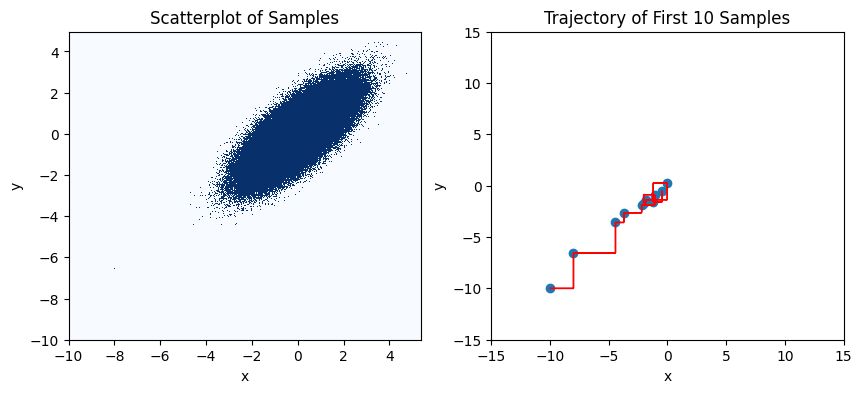

In [5]:
# plotting
fig = plt.figure(figsize=(10,4))
# histogram
ax_1 = fig.add_subplot(1,2,1)
hist = ax_1.hist2d(samples_gibbs[:, 0], samples_gibbs[:, 1], bins = 500, cmap="Blues", density=False, vmin=0, vmax=1)
# trajectories
ax_2 = fig.add_subplot(1,2,2)
traj = ax_2.scatter(samples_gibbs[0:11, 0], samples_gibbs[0:11, 1])
for i in range(10):
  dx = samples_gibbs[i+1, 0] - samples_gibbs[i, 0]
  dy = samples_gibbs[i+1, 1] - samples_gibbs[i, 1]
  ax_2.arrow(samples_gibbs[i, 0], samples_gibbs[i, 1], dx, 0, head_width=0.05, length_includes_head=True, color='red')
  ax_2.arrow(samples_gibbs[i, 0]+dx, samples_gibbs[i, 1], 0, dy, head_width=0.05, length_includes_head=True, color='red')
ax_2.set_xlim(-15,15)
ax_2.set_ylim(-15,15)
ax_1.set_xlabel("x")
ax_1.set_ylabel("y")
ax_2.set_xlabel("x")
ax_2.set_ylabel("y")
ax_1.set_title("Scatterplot of Samples")
ax_2.set_title("Trajectory of First 10 Samples")
plt.show()

In [6]:
@jit(nopython=True)
def matmul_2(M, x):
  # custom function for multiplying a 2x2 matrix with vector
  return np.array([M[0,0]*x[0]+M[0,1]*x[1], M[1,0]*x[0]+M[1,1]*x[1]])

@jit(nopython=True)
def bivariate_normal_hit(length, rho, X_0):
  samples = np.zeros((length+1, 2))
  c_inv = np.array([[1, -rho], [-rho, 1]]) / (1 - rho**2)
  c_inv_root = np.array([[np.sqrt((1-rho)/2), np.sqrt((1-rho)/2)], [np.sqrt((1+rho)/2), -np.sqrt((1+rho)/2)]])/ (np.sqrt(1 - rho**2))

  samples[0] = X_0
  for k in range(length):
    ang = np.random.uniform(0, 2*np.pi)
    v = np.array([np.cos(ang), np.sin(ang)])
    Z = np.random.normal(0,1)
    c_inv_v = matmul_2(c_inv, v)
    c_inv_root_v = matmul_2(c_inv_root, v)
#    h = -(np.dot(samples[k], c_inv_v)) / (c_inv_root_v[0]**2 + c_inv_root_v[1]**2) + Z / (np.sqrt(c_inv_root_v[0]**2 + c_inv_root_v[1]**2))
    h = -(np.dot(samples[k], c_inv_v)) / (np.dot(v, c_inv_v)) + Z / (np.sqrt(np.dot(v, c_inv_v)))
    samples[k+1] = samples[k] + h * v

  return samples

In [7]:
matmul_2(np.array([[1,2],[3,4]]), np.array([1,2]))

array([ 5, 11])

In [8]:
samples_hit = bivariate_normal_hit(1000000, 0.75, X_0 = np.array([-10, -10]))

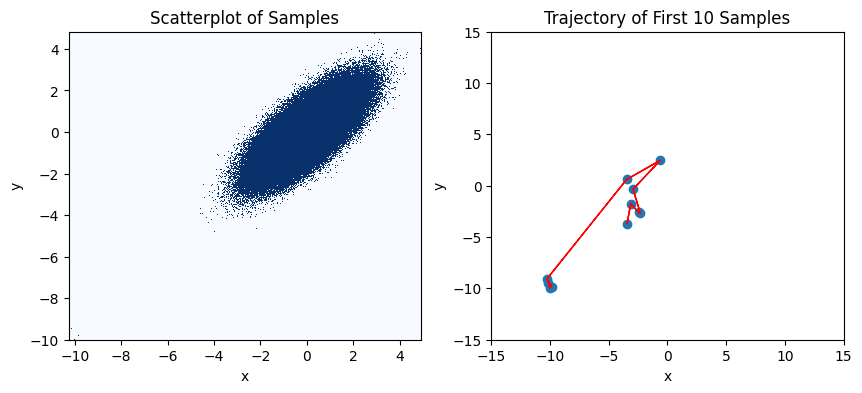

In [9]:
# plotting
fig = plt.figure(figsize=(10,4))
# histogram
ax_1 = fig.add_subplot(1,2,1)
hist = ax_1.hist2d(samples_hit[:, 0], samples_hit[:, 1], bins = 500, cmap='Blues', density=False, vmin=0, vmax=1)
# trajectories
ax_2 = fig.add_subplot(1,2,2)
traj = ax_2.scatter(samples_hit[0:11, 0], samples_hit[0:11, 1])
for i in range(10):
  dx = samples_hit[i+1, 0] - samples_hit[i, 0]
  dy = samples_hit[i+1, 1] - samples_hit[i, 1]
  ax_2.arrow(samples_hit[i, 0], samples_hit[i, 1], dx, dy, head_width=0.05, length_includes_head=True, color='red')
ax_2.set_xlim(-15,15)
ax_2.set_ylim(-15,15)
ax_1.set_xlabel("x")
ax_1.set_ylabel("y")
ax_2.set_xlabel("x")
ax_2.set_ylabel("y")
ax_1.set_title("Scatterplot of Samples")
ax_2.set_title("Trajectory of First 10 Samples")
plt.show()

In [10]:
# autocorrelation analysis... choose X^T C^{-1}X as observable
C_inv = np.array([[1, -rho], [-rho, 1]]) / (1 - rho**2)
C_inv_root = np.array([[np.sqrt((1-rho)/2), np.sqrt((1-rho)/2)], [np.sqrt((1+rho)/2), -np.sqrt((1+rho)/2)]])/ (np.sqrt(1 - rho**2))

@jit(nopython=True)
def generate_observable_r(samples, cov_inv):
  # generate observable
  observable = np.zeros(samples.shape[0])
  for k in range(observable.shape[0]):
    observable[k] = np.sqrt(np.dot(samples[k], matmul_2(cov_inv, samples[k])))

  # feed in 4/5 of the observable
  feedin_l = int(observable.shape[0] * 0.8)
  observable = observable[-feedin_l:]

  return observable

@jit(nopython=True)
def generate_observable_a(samples, cov_inv_root):
  # generate observable
  observable = np.zeros(samples.shape[0])
  for k in range(observable.shape[0]):
    observable[k] = samples[k, 0] + samples[k, 1]

  # feed in 4/5 of the observable
  feedin_l = int(observable.shape[0] * 0.8)
  observable = observable[-feedin_l:]

  return observable

def iat(samples, cov_inv, obs_name, cov_inv_root = None):
  if obs_name == "r":
    observable = generate_observable_r(samples, cov_inv)
  if obs_name == "a":
    if cov_inv_root is None:
      root = la.cholesky(cov_inv, lower=False)
      observable = generate_observable_a(samples, root)
    else:
      observable = generate_observable_a(samples, cov_inv_root)

  # autocorrelation function and IAT
  autocorr_func = emcee.autocorr.function_1d(observable)
  iat = emcee.autocorr.integrated_time(observable)

  # plot the autocorrelation function
  steps = range(autocorr_func.shape[0])
  steps = steps / iat
  fig = plt.figure(figsize=(11,4))
  ax_1 = fig.add_subplot(1,2,1)
  ax_1.plot(steps[:2500], autocorr_func[:2500])
  ax_1.set_xlabel(r"updates / $\tau$")
  ax_1.set_ylabel(r"$\rho(\tau)$")
  ax_1.set_title("Autocorr. Function First 2500 Steps")
  ax_2 = fig.add_subplot(1,2,2)
  ax_2.plot(steps[-10000:], autocorr_func[-10000:])
  ax_2.set_xlabel(r"updates / $\tau$")
  ax_2.set_ylabel(r"$\rho(\tau)$")
  ax_2.set_title("Autocorr. Function Last 10,000 Steps")
  fig.tight_layout()
  plt.show()

  # print the IAT
  print("Estimated IAT: ", iat)

  return autocorr_func, iat


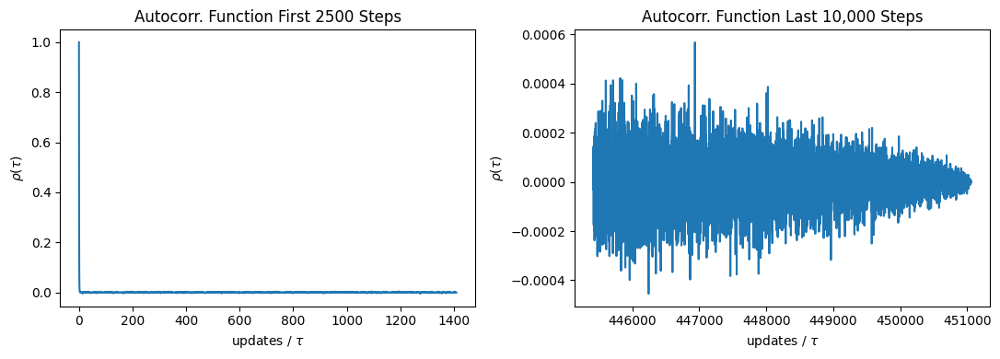

Estimated IAT:  [1.77360509]


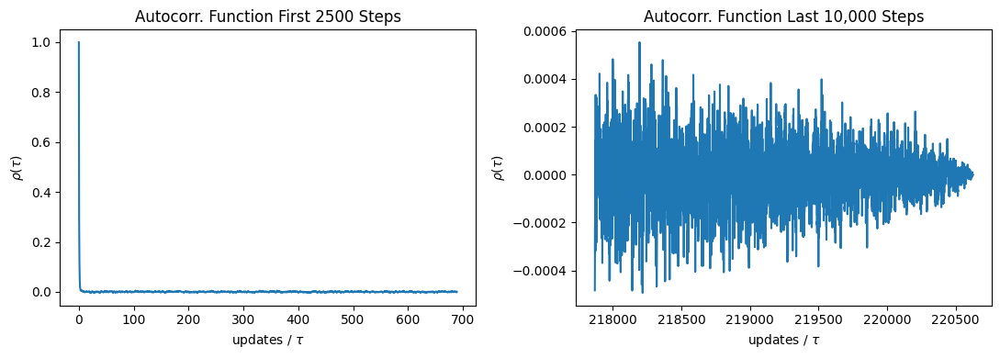

Estimated IAT:  [3.62603951]


In [11]:
autocorr_f_gibbs, iat_gibbs = iat(samples_gibbs, C_inv, "r")
autocorr_f_hit, iat_hit = iat(samples_hit, C_inv, "r")

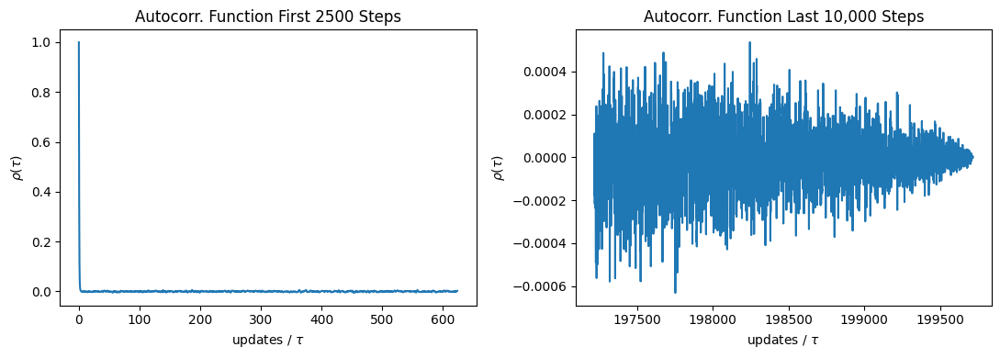

Estimated IAT:  [4.00570167]


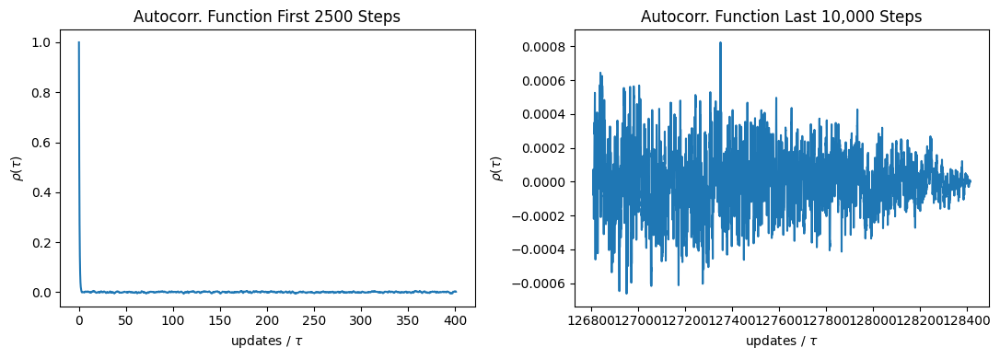

Estimated IAT:  [6.22987212]


In [12]:
autocorr_f_gibbs_a, iat_gibbs_a = iat(samples_gibbs, C_inv, "a", C_inv_root)
autocorr_f_hit_a, iat_hit_a = iat(samples_hit, C_inv, "a", C_inv_root)

## Task 2: Bivariate Normal with Large and Small Variances

In [13]:
# Gibbs sampler for bivariate normal w large/small variances
# covariance matrix is diagonal
@jit(nopython=True)
def bivar_normal_gibbs_2(length, alpha, X_0):
  samples = np.zeros((length+1, 2))

  samples[0] = X_0
  for j in range(length):
    # the scale parameter in np.random.normal is standard deviation
    samples[j+1, 0] = np.random.normal(0, np.sqrt(alpha))
    samples[j+1, 1] = np.random.normal(0, 1)

  return samples


In [14]:
samples_gibbs_2 = bivar_normal_gibbs_2(10000000, 5, np.zeros(2))

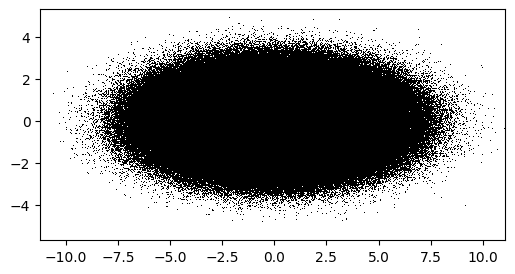

In [15]:
# plotting
fig = plt.figure(figsize=(6,3))
# histogram
ax = fig.add_subplot(1,1,1)
hist = ax.hist2d(samples_gibbs_2[:, 0], samples_gibbs_2[:, 1], bins=500, cmap="binary", density=False, vmin=0, vmax=1)
plt.show()

In [16]:
# hit-and-run that handles diagonal covariance matrices
@jit(nopython=True)
def bivar_normal_hit_2(length, var_list, X_0):
  samples = np.zeros((length+1, 2))
  dim = var_list.shape[0]
  c_inv = np.diag(np.ones(dim) / var_list)
  c_inv_root = np.diag(np.ones(dim) / np.sqrt(var_list))
  print(c_inv)

  samples[0] = X_0
  for k in range(length):
    # to sample the uniform distribution on the sphere, use that Gaussians are
    # rotation invariant, so we sample a Gaussian and project to the unit sphere
    ang = np.random.normal(0, 1, size=dim)
    v = ang / np.sqrt(np.sum(ang**2))
    Z = np.random.normal(0,1)
    h = -(np.dot(samples[k], np.dot(c_inv, v))) / (np.dot(v, np.dot(c_inv, v))) + Z / (np.sqrt(np.dot(v, np.dot(c_inv, v))))
    samples[k+1] = samples[k] + h * v

  return samples, c_inv, c_inv_root

@jit(nopython=True)
def bivar_normal_hit_2_s(length, var_list, X_0):
  samples = np.zeros((length+1, 2))
  dim = var_list.shape[0]
  c_inv = np.diag(np.ones(dim) / var_list)
  c_inv_root = np.diag(np.ones(dim) / np.sqrt(var_list))
  print(c_inv)

  samples[0] = X_0
  for k in range(length):
    # to sample the uniform distribution on the sphere, use that Gaussians are
    # rotation invariant, so we sample a Gaussian and project to the unit sphere
    phi = np.random.uniform(0, 2* np.pi)
    v = np.array([np.cos(phi), np.sin(phi)])
    Z = np.random.normal(0,1)
    h = -(np.dot(samples[k], np.dot(c_inv, v))) / (np.dot(v, np.dot(c_inv, v))) + Z / (np.sqrt(np.dot(v, np.dot(c_inv, v))))
    samples[k+1] = samples[k] + h * v

  return samples, c_inv, c_inv_root

In [17]:
samples_hit_2, C_inv, C_inv_root = bivar_normal_hit_2(10000000, np.array([16,1]), np.zeros(2))

[[0.0625 0.    ]
 [0.     1.    ]]


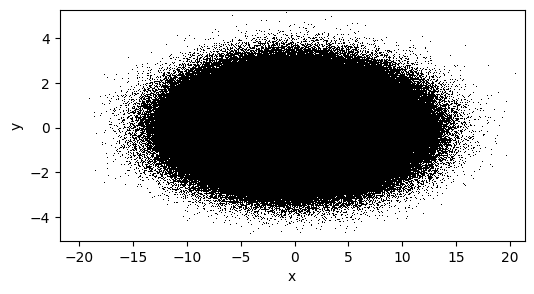

In [18]:
# plotting
fig = plt.figure(figsize=(6,3))
# histogram
ax = fig.add_subplot(1,1,1)
hist = ax.hist2d(samples_hit_2[:, 0], samples_hit_2[:, 1], bins=500, cmap="binary", density=False, vmin=0, vmax=1)
ax.set_xlabel("x")
ax.set_ylabel("y")
plt.show()

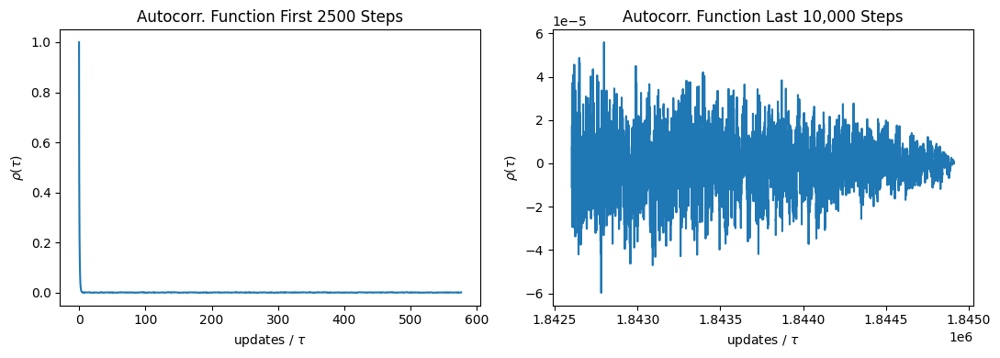

Estimated IAT:  [4.3362551]


In [19]:
autocurr_f_hit2, iat_hit_2 = iat(samples_hit_2, C_inv, "r", C_inv_root)

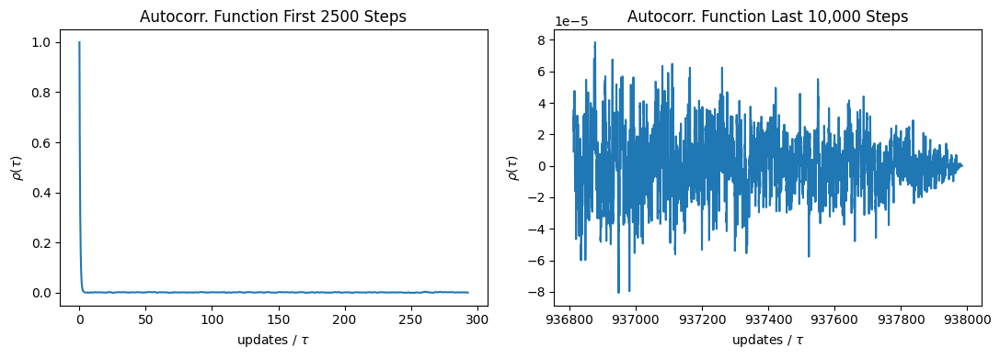

Estimated IAT:  [8.52891953]


In [20]:
autocorr_f_hit2_a, iat_hit2_a = iat(samples_hit_2, C_inv, "a", C_inv_root)
#print(iat_hit2_a.shape)

[[0.11111111 0.        ]
 [0.         1.        ]]


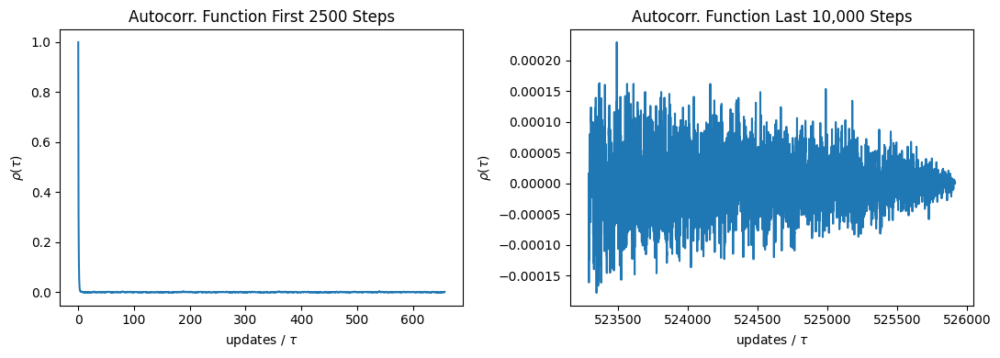

Estimated IAT:  [3.80288903]


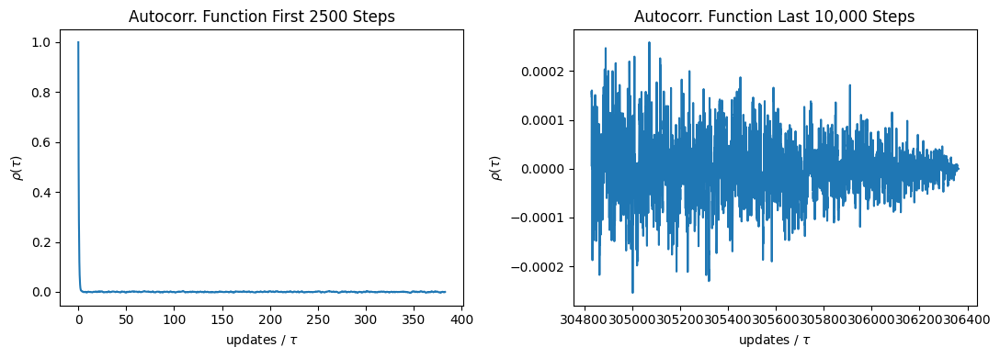

Estimated IAT:  [6.52821736]
[[0.07224335 0.        ]
 [0.         1.        ]]


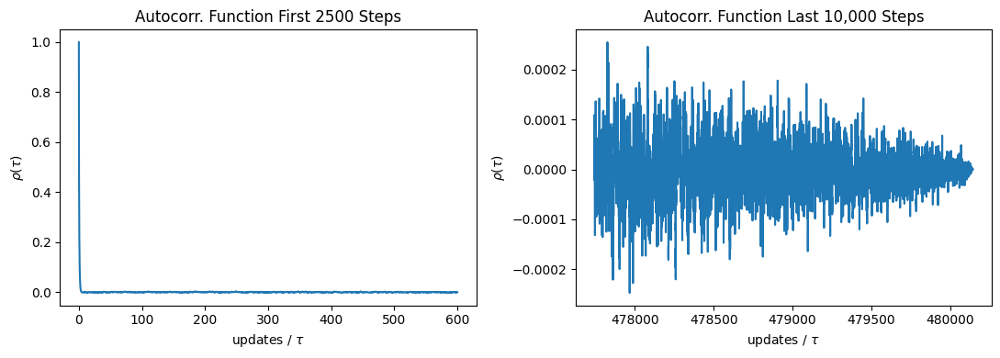

Estimated IAT:  [4.16541738]


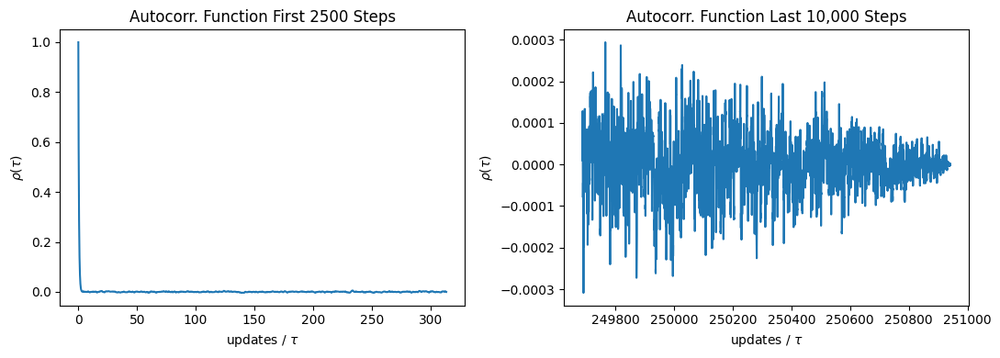

Estimated IAT:  [7.96996967]
[[0.05352113 0.        ]
 [0.         1.        ]]


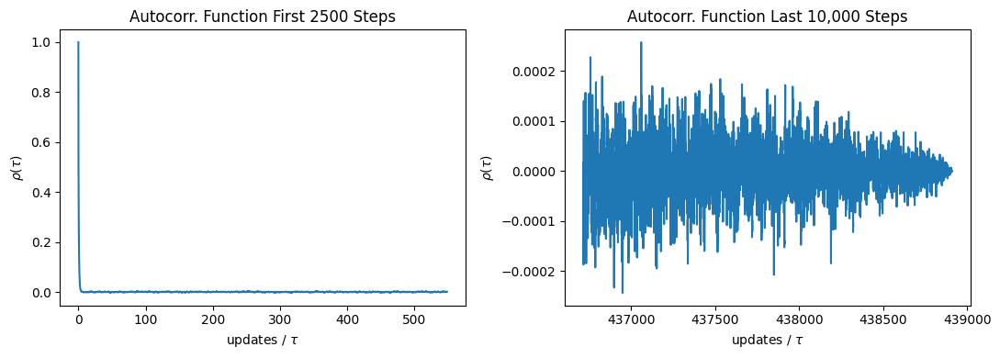

Estimated IAT:  [4.55676288]


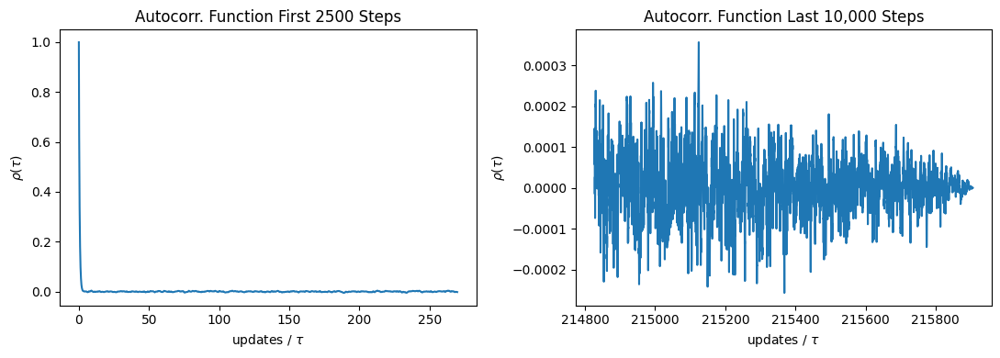

Estimated IAT:  [9.26327953]
[[0.04250559 0.        ]
 [0.         1.        ]]


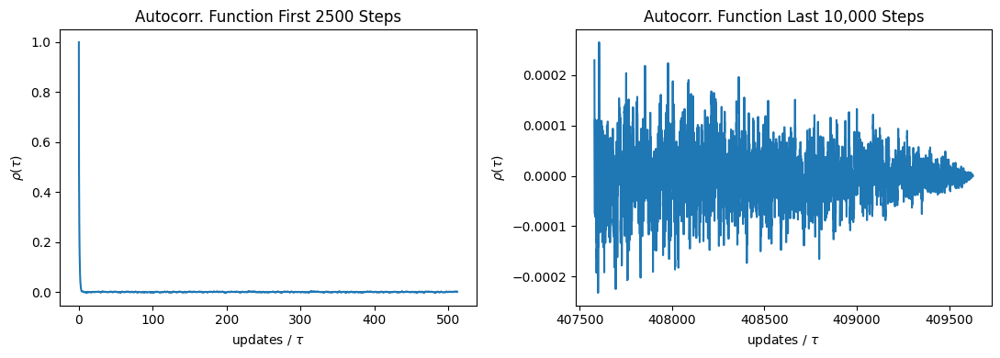

Estimated IAT:  [4.88247761]


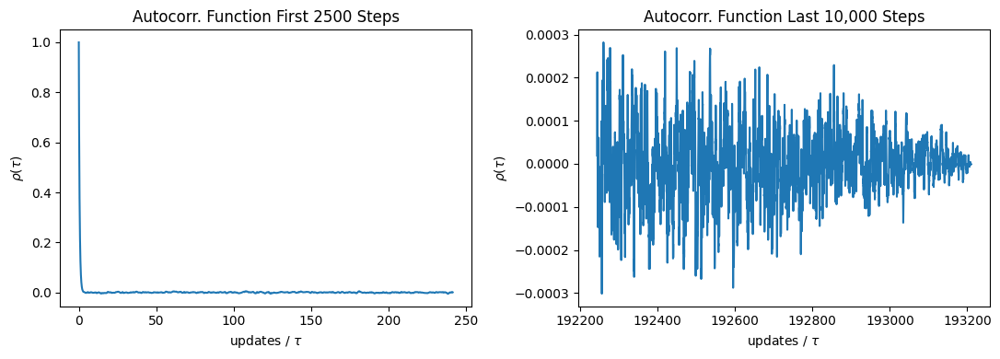

Estimated IAT:  [10.35143996]
[[0.03525046 0.        ]
 [0.         1.        ]]


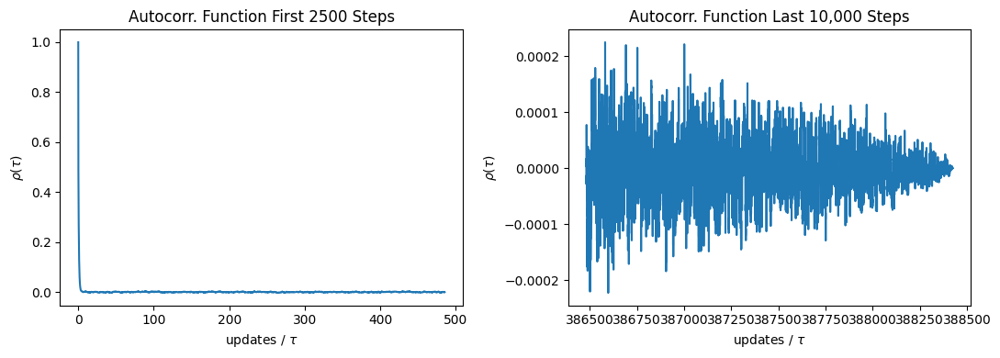

Estimated IAT:  [5.14900853]


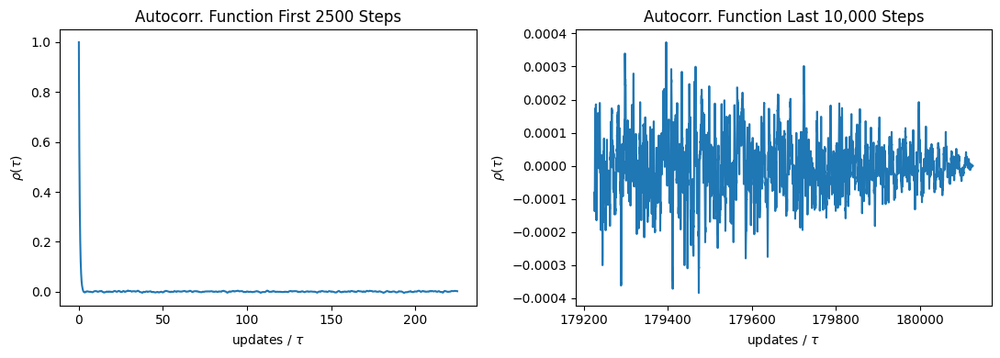

Estimated IAT:  [11.10334296]
[[0.03011094 0.        ]
 [0.         1.        ]]


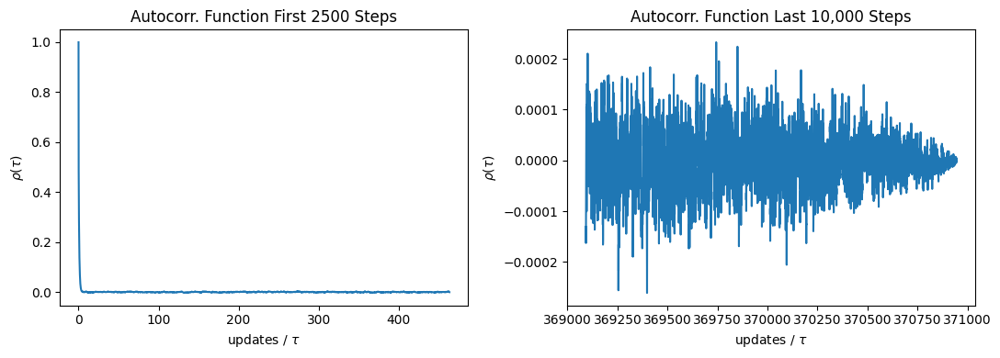

Estimated IAT:  [5.3916063]


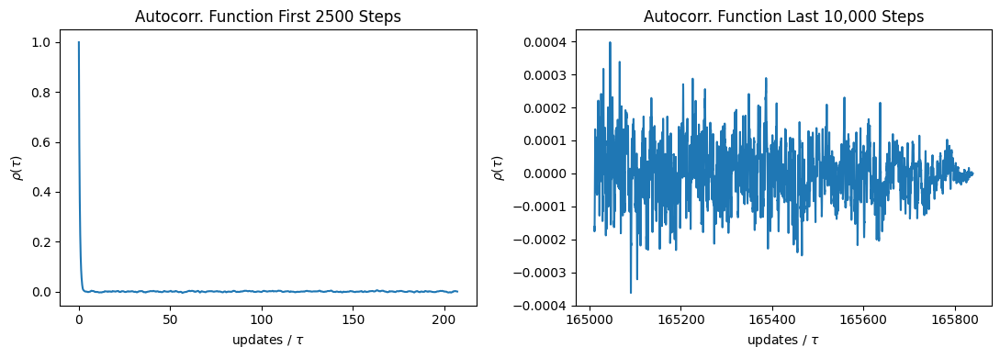

Estimated IAT:  [12.05982751]
[[0.02627939 0.        ]
 [0.         1.        ]]


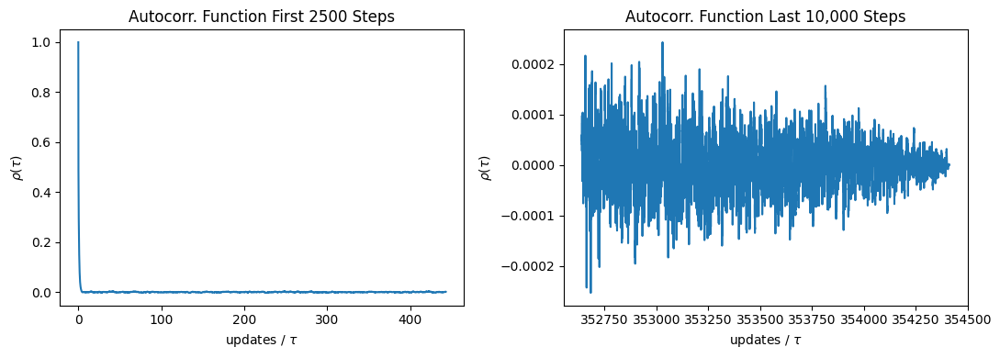

Estimated IAT:  [5.64314916]


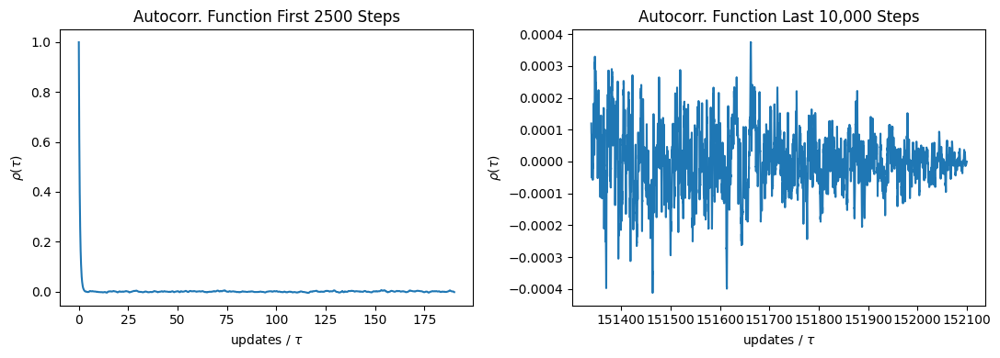

Estimated IAT:  [13.14923847]
[[0.02331288 0.        ]
 [0.         1.        ]]


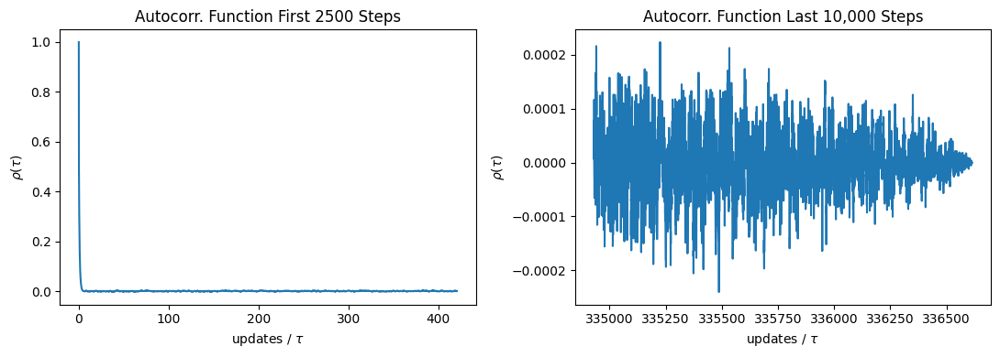

Estimated IAT:  [5.94153351]


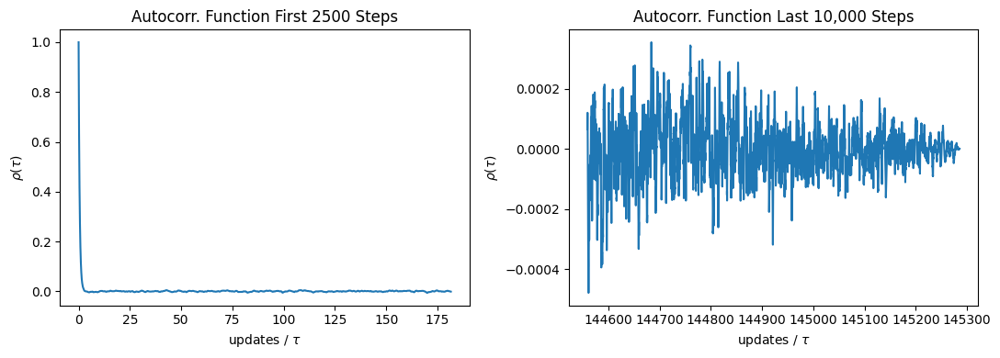

Estimated IAT:  [13.76598412]
[[0.02094818 0.        ]
 [0.         1.        ]]


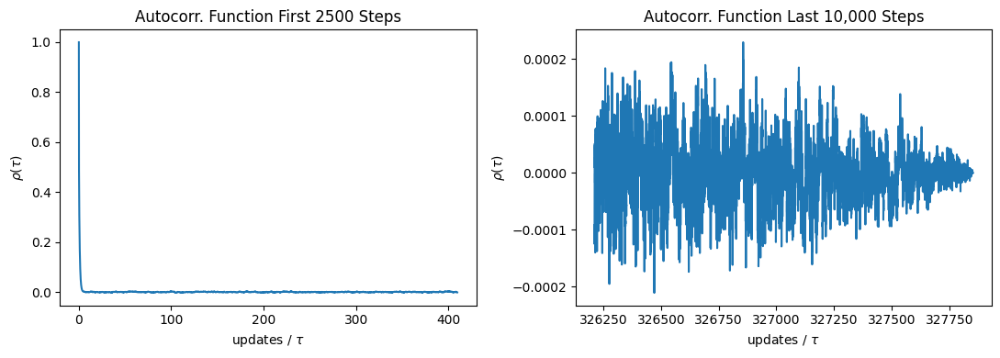

Estimated IAT:  [6.10032969]


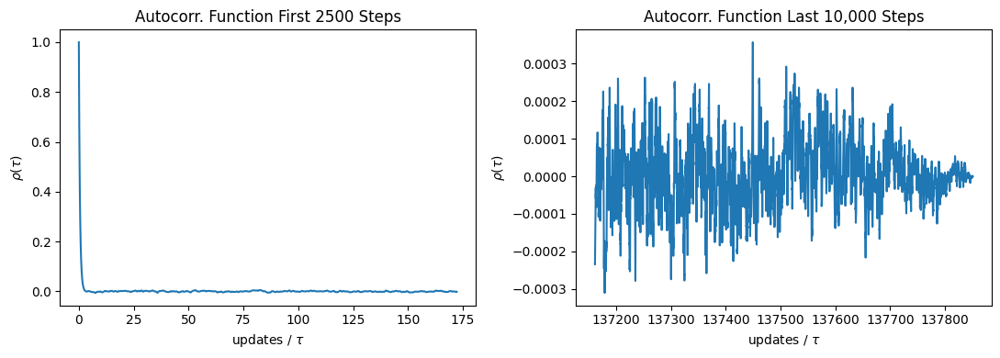

Estimated IAT:  [14.50844284]
[[0.01901902 0.        ]
 [0.         1.        ]]


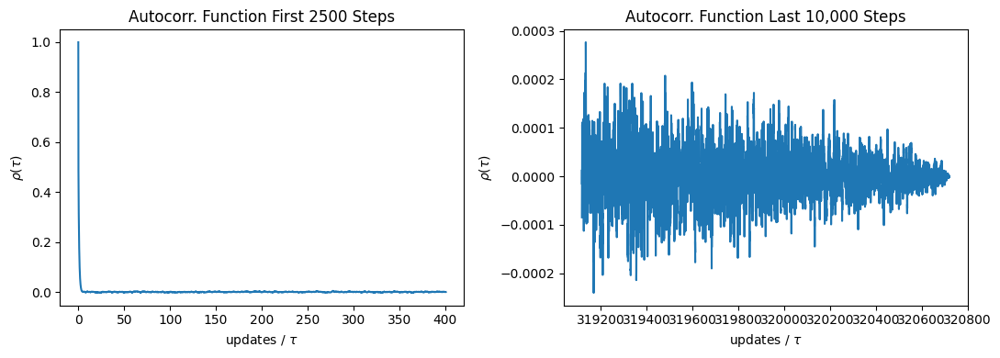

Estimated IAT:  [6.23595405]


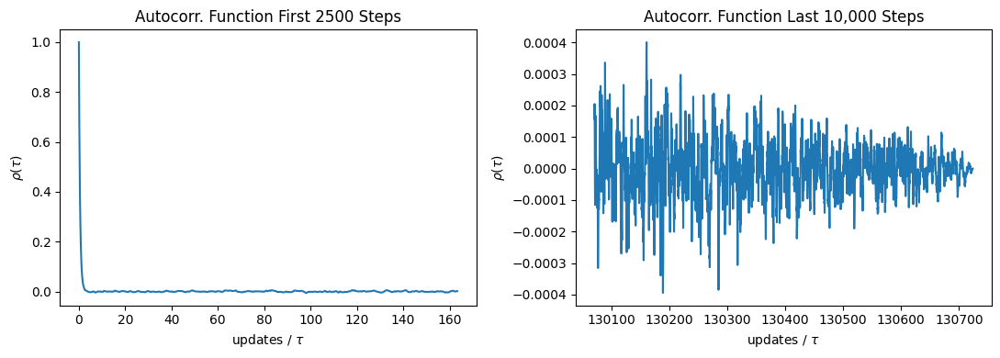

Estimated IAT:  [15.2994123]
[[0.01741522 0.        ]
 [0.         1.        ]]


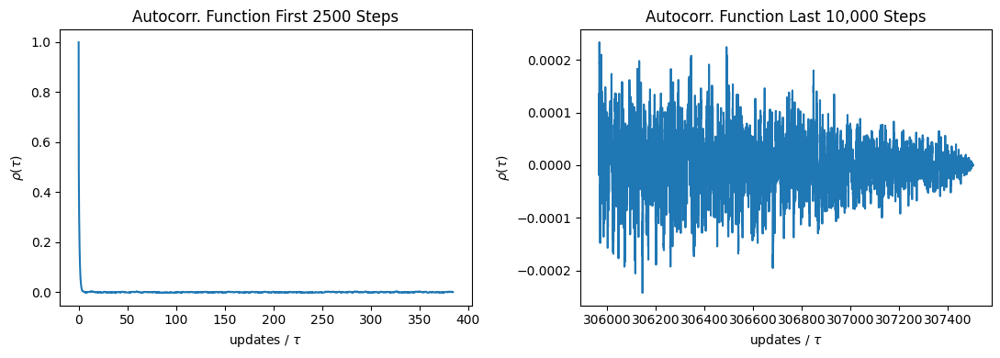

Estimated IAT:  [6.50399516]


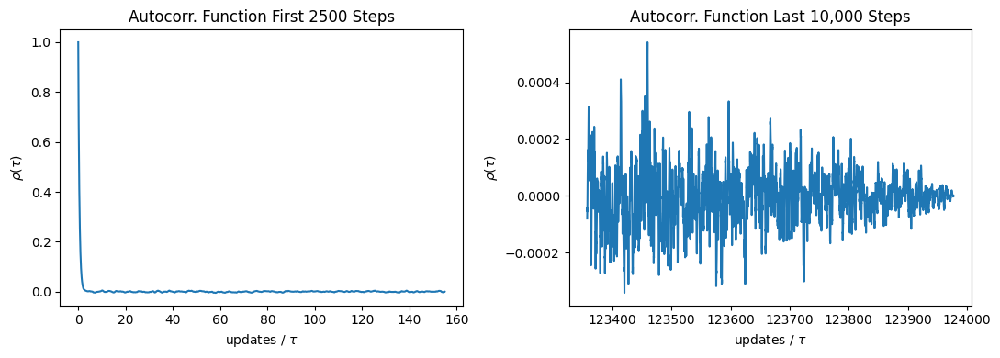

Estimated IAT:  [16.13195803]
[[0.01606086 0.        ]
 [0.         1.        ]]


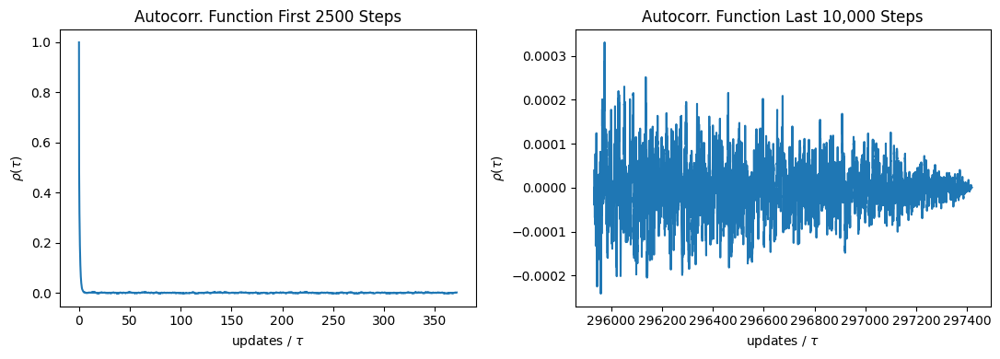

Estimated IAT:  [6.72450856]


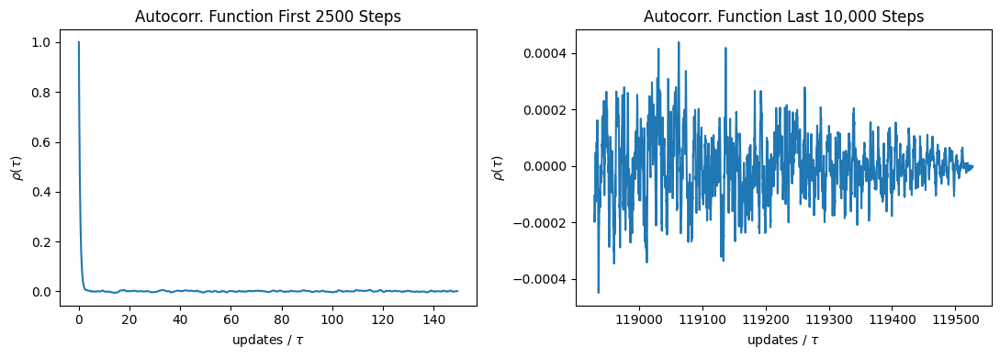

Estimated IAT:  [16.7325473]
[[0.01490196 0.        ]
 [0.         1.        ]]


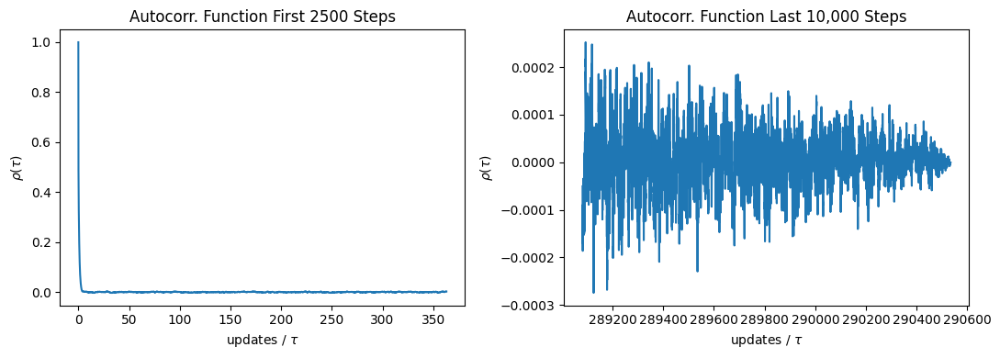

Estimated IAT:  [6.8838718]


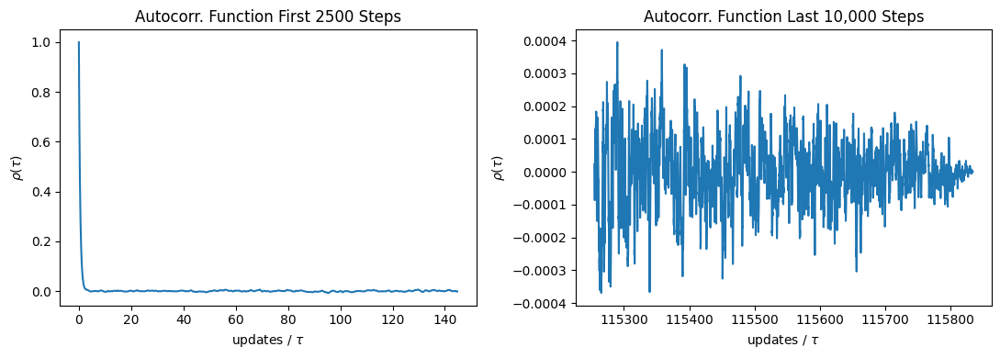

Estimated IAT:  [17.26607651]
[[0.01389905 0.        ]
 [0.         1.        ]]


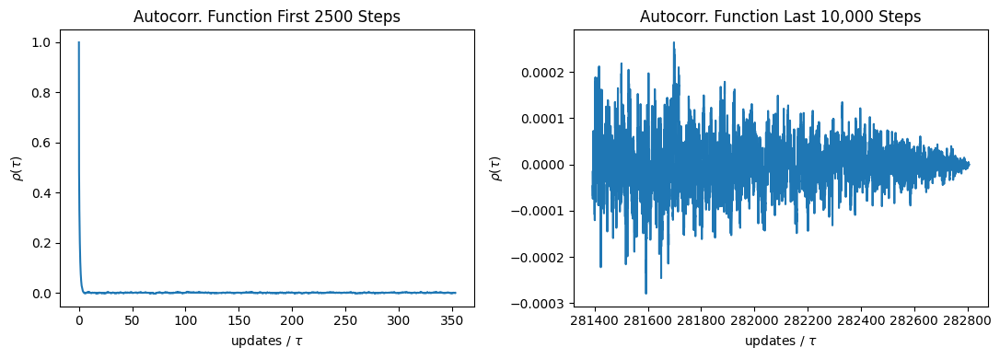

Estimated IAT:  [7.071973]


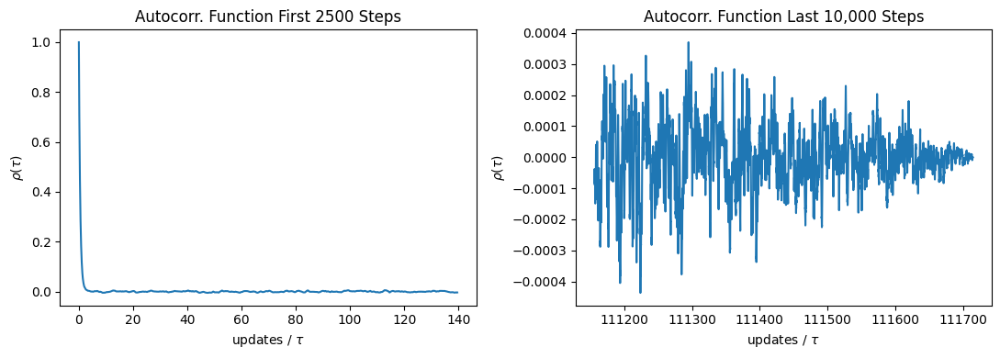

Estimated IAT:  [17.90277027]
[[0.01302262 0.        ]
 [0.         1.        ]]


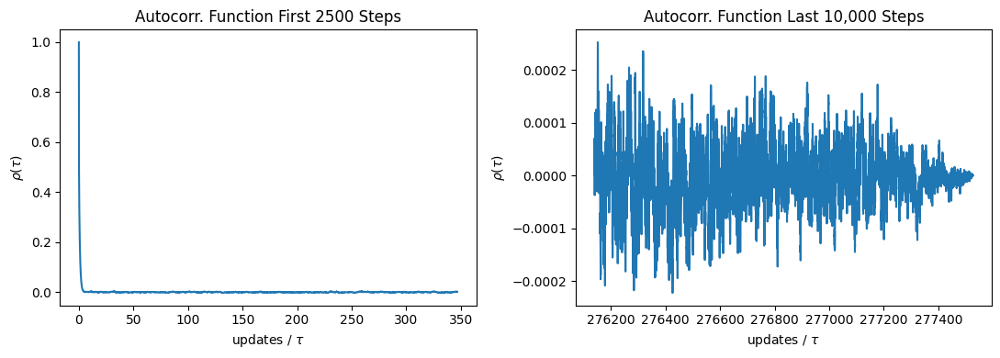

Estimated IAT:  [7.20650888]


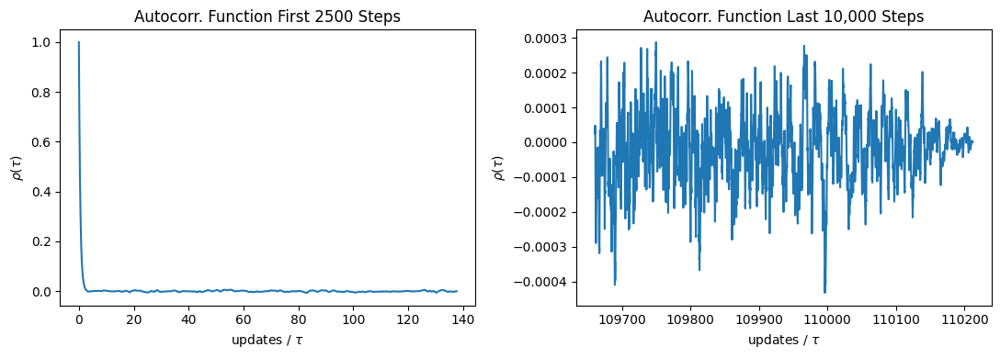

Estimated IAT:  [18.14683258]
[[0.01225016 0.        ]
 [0.         1.        ]]


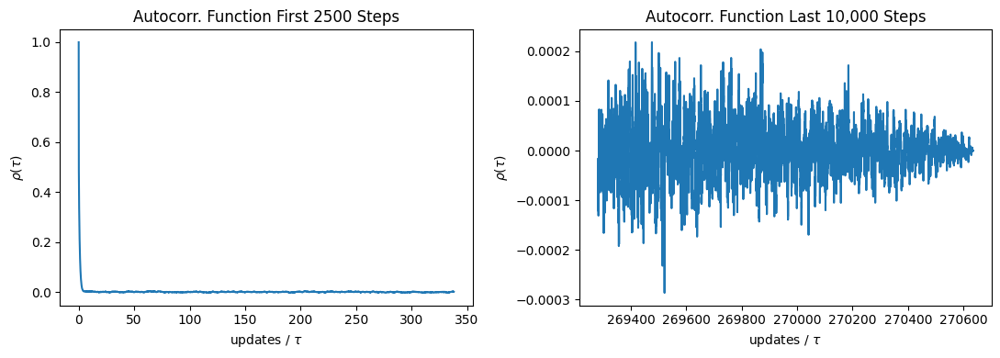

Estimated IAT:  [7.39004054]


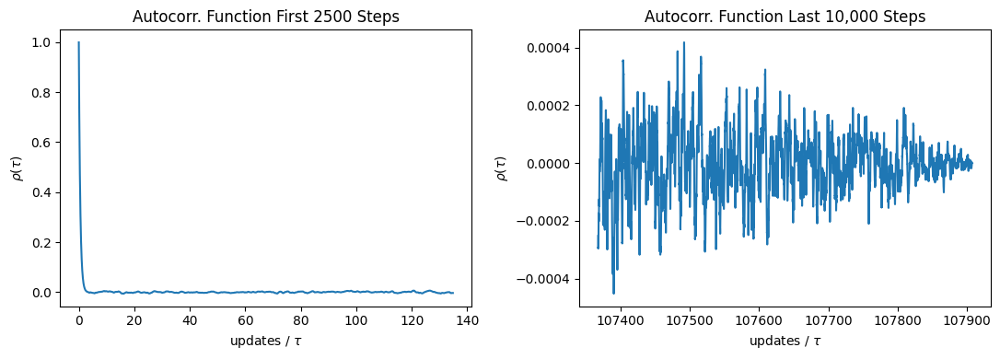

Estimated IAT:  [18.5343726]
[[0.01156421 0.        ]
 [0.         1.        ]]


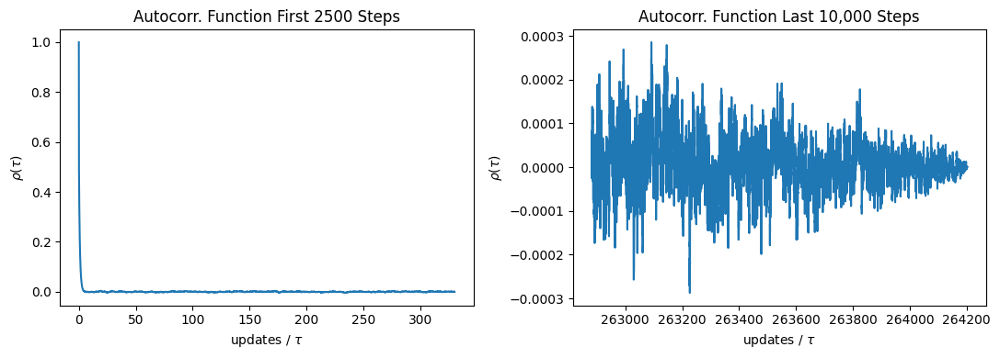

Estimated IAT:  [7.56995454]


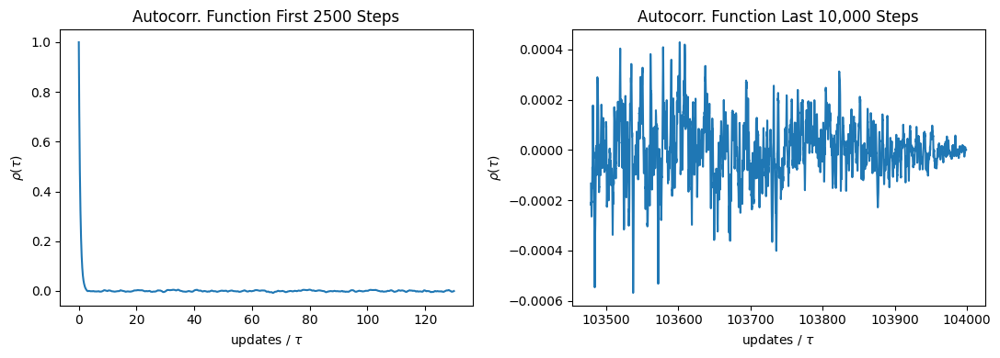

Estimated IAT:  [19.23096881]
[[0.01095101 0.        ]
 [0.         1.        ]]


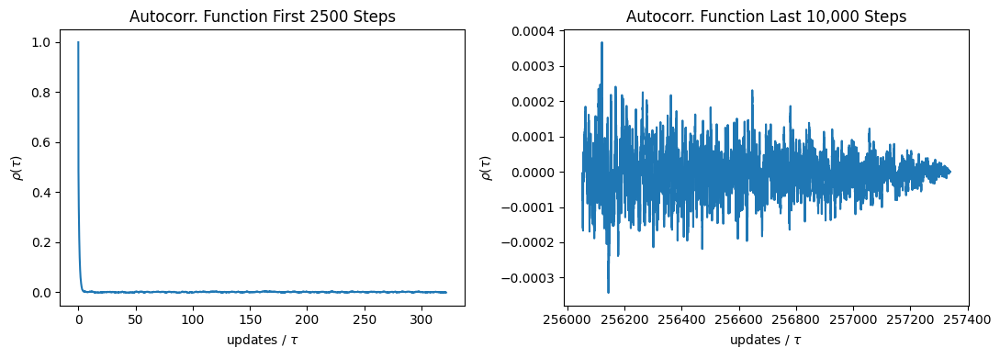

Estimated IAT:  [7.77184975]


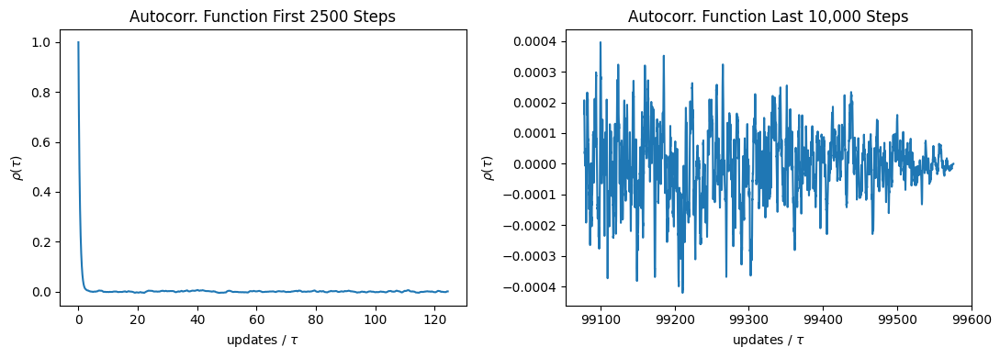

Estimated IAT:  [20.08520719]
[[0.01039956 0.        ]
 [0.         1.        ]]


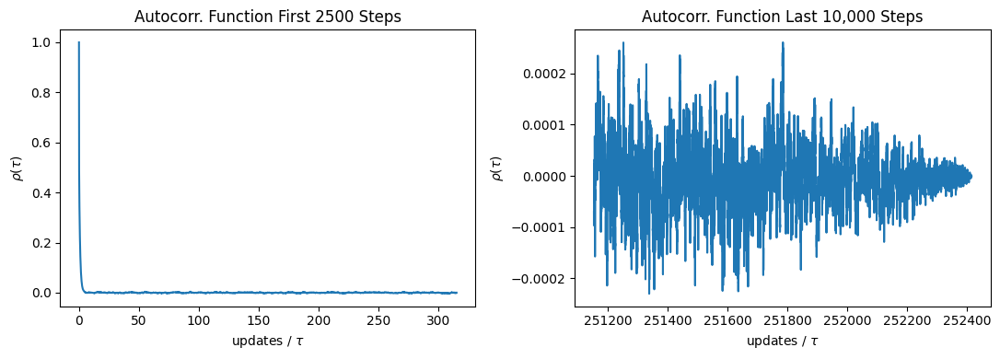

Estimated IAT:  [7.92345606]


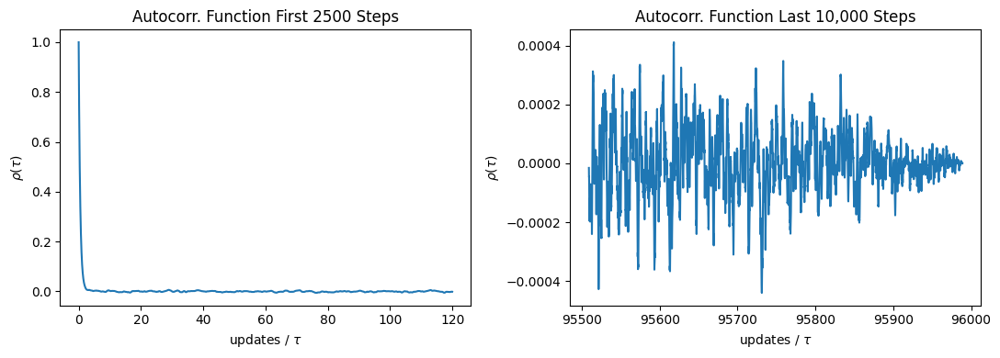

Estimated IAT:  [20.83573307]
[[0.00990099 0.        ]
 [0.         1.        ]]


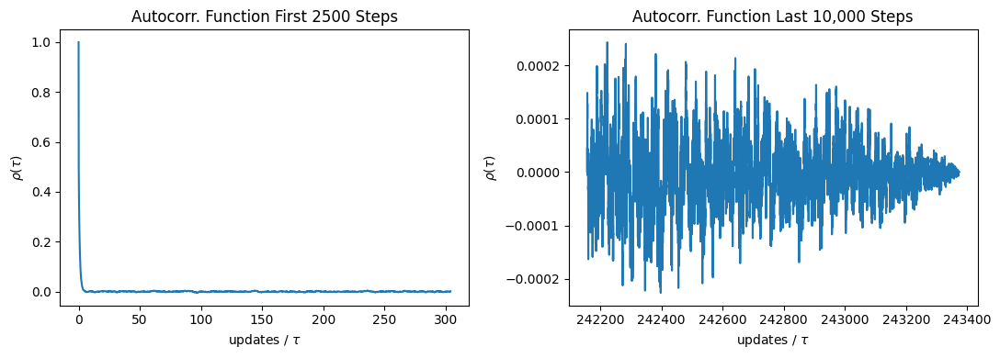

Estimated IAT:  [8.217828]


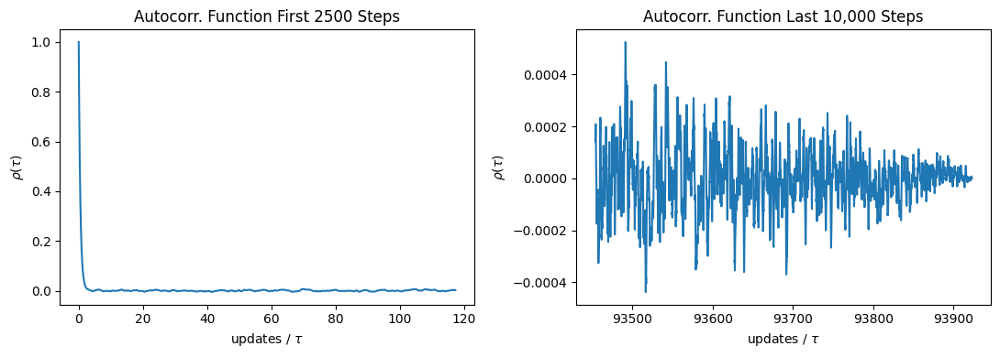

Estimated IAT:  [21.29397912]


In [21]:
alpha_li = np.linspace(9, 101, 20)
iat_r_li = []
iat_a_li = []
for alpha in alpha_li:
  var_li = np.array([alpha, 1])
  samples_hit, C_inv, C_inv_root = bivar_normal_hit_2(2500000, var_li, np.zeros(2))
  f_tau_r, iat_r = iat(samples_hit, C_inv, "r", C_inv_root)
  iat_r_li.append(iat_r)
  f_tau_a, iat_a = iat(samples_hit, C_inv, "a", C_inv_root)
  iat_a_li.append(iat_a)

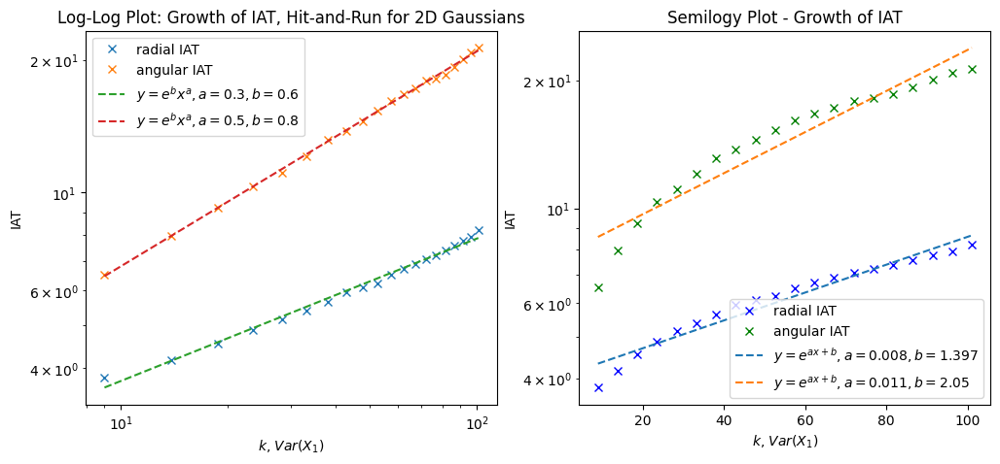

In [27]:
log_alpha = np.log(np.array(alpha_li))
log_iat_r = np.log(np.array(iat_r_li)).flatten()
log_iat_a = np.log(np.array(iat_a_li)).flatten()
fit_line = np.polyfit(log_alpha, log_iat_r, 1)
p = np.poly1d(fit_line)
fit_line_a = np.polyfit(log_alpha, log_iat_a, 1)
p_a = np.poly1d(fit_line_a)

fit_line_er = np.polyfit(np.array(alpha_li), log_iat_r, 1)
p_er = np.poly1d(fit_line_er)
fit_line_ea = np.polyfit(np.array(alpha_li), log_iat_a, 1)
p_ea = np.poly1d(fit_line_ea)

fig = plt.figure(figsize=(12,5))
ax = fig.add_subplot(1,2,1)
ax.loglog(alpha_li, iat_r_li, 'x', label="radial IAT")
ax.loglog(alpha_li, iat_a_li, 'x', label="angular IAT")
ax.loglog(alpha_li, np.exp(p(log_alpha)), '--', label=r"$y = e^{{b}}x^{{a}}, a = {a}, b = {b}$".format(a = round(fit_line[0], 1), b = round(fit_line[1], 1)))
ax.loglog(alpha_li, np.exp(p_a(log_alpha)), '--', label=r"$y = e^{{b}}x^{{a}}, a = {a}, b = {b}$".format(a = round(fit_line_a[0], 1), b = round(fit_line_a[1], 1)))
ax.legend()
ax.set_xlabel(r"$k$, $Var(X_1)$")
ax.set_ylabel(r"IAT")
ax.set_title(r"Log-Log Plot: Growth of IAT, Hit-and-Run for 2D Gaussians")
ax_2 = fig.add_subplot(1,2,2)
ax_2.semilogy(alpha_li, iat_r_li, 'bx', label="radial IAT")
ax_2.semilogy(alpha_li, iat_a_li, 'gx', label="angular IAT")
ax_2.semilogy(alpha_li, np.exp(p_er(np.array(alpha_li))), '--', label=r"$y = e^{{ax+b}}, a = {a}, b = {b}$".format(a = round(fit_line_er[0], 3), b = round(fit_line_er[1], 3)))
ax_2.semilogy(alpha_li, np.exp(p_ea(np.array(alpha_li))), '--', label=r"$y = e^{{ax+b}}, a = {a}, b = {b}$".format(a = round(fit_line_ea[0], 3), b = round(fit_line_ea[1], 3)))
ax_2.legend()
ax_2.set_xlabel(r"$k$, $Var(X_1)$")
ax_2.set_ylabel(r"IAT")
ax_2.set_title(r"Semilogy Plot - Growth of IAT")
plt.show()

In [28]:
# comparing running times for different implementations of hit-and-run
import time
start = time.time()
samples_hit_2_s, C_inv, C_inv_root = bivar_normal_hit_2_s(20000000, np.array([16,1]), np.zeros(2))
end = time.time()
print("Running time for implementation using spherical coordinates: ", end - start)
start_g = time.time()
samples_hit_2, C_inv, C_inv_root = bivar_normal_hit_2(20000000, np.array([16,1]), np.zeros(2))
end_g = time.time()
print("Running time for implementation by projecting Gaussian: ", end_g - start_g)


[[0.0625 0.    ]
 [0.     1.    ]]
Running time for implementation using spherical coordinates:  10.788660764694214
[[0.0625 0.    ]
 [0.     1.    ]]
Running time for implementation by projecting Gaussian:  13.621458292007446


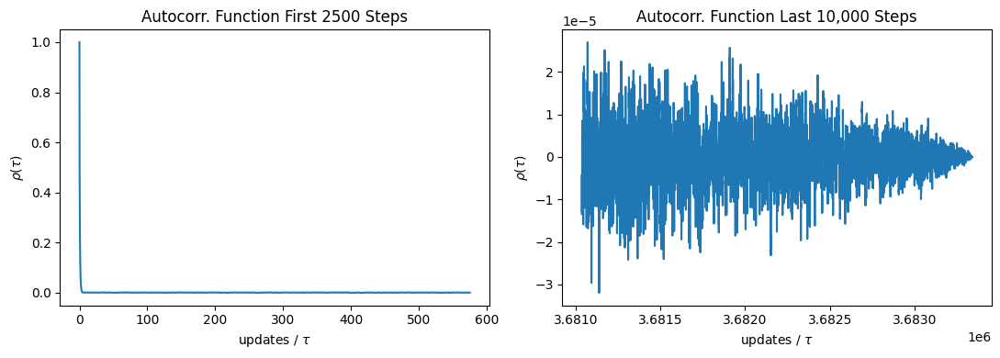

Estimated IAT:  [4.34388411]


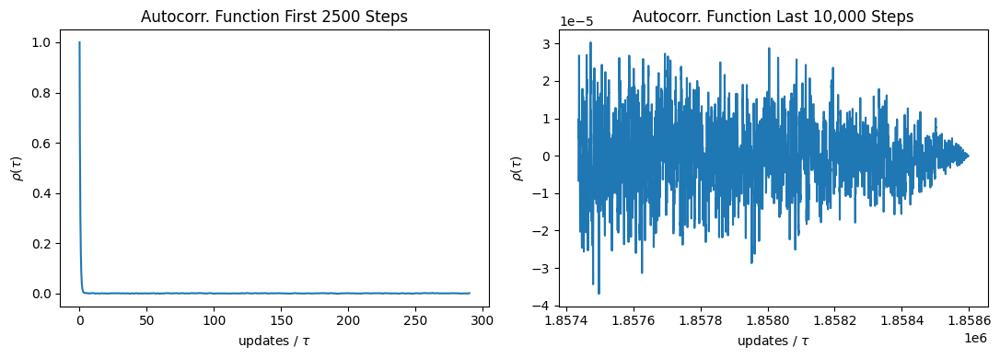

Estimated IAT:  [8.6086386]


In [29]:
# decay of autocorrelation function for the spherical coordinates implementation
autocurr_f_hit2_s, iat_hit_2_s = iat(samples_hit_2_s, C_inv, "r", C_inv_root)
autocurr_f_hit2_sa, iat_hit_2_sa = iat(samples_hit_2_s, C_inv, "a", C_inv_root)

## Task 3: 3D Independent Gaussian with Large and Small Variances

In [30]:
# hit-and-run that handles diagonal covariance matrices
@jit(nopython=True)
def multivar_normal_hit_2(length, var_list, X_0):
  dim = var_list.shape[0]
  samples = np.zeros((length+1, dim))
  c_inv = np.diag(np.ones(dim) / var_list)
  c_inv_root = np.diag(np.ones(dim) / np.sqrt(var_list))
  print(c_inv)

  samples[0] = X_0
  for k in range(length):
    # to sample the uniform distribution on the sphere, use that Gaussians are
    # rotation invariant, so we sample a Gaussian and project to the unit sphere
    ang = np.random.normal(0, 1, size=dim)
    v = ang / np.sqrt(np.sum(ang**2))
    Z = np.random.normal(0,1)
    h = -(np.dot(samples[k], np.dot(c_inv, v))) / (np.dot(v, np.dot(c_inv, v))) + Z / (np.sqrt(np.dot(v, np.dot(c_inv, v))))
    samples[k+1] = samples[k] + h * v

  return samples, c_inv, c_inv_root


In [31]:
# need to modify the iat function for more than 2d
@jit(nopython=True)
def generate_observable_r(samples, cov_inv):
  # generate observable
  observable = np.zeros(samples.shape[0])
  for k in range(observable.shape[0]):
    observable[k] = np.sqrt(np.dot(samples[k], np.dot(cov_inv, samples[k])))

  # feed in 4/5 of the observable
  feedin_l = int(observable.shape[0] * 0.8)
  observable = observable[-feedin_l:]

  return observable

@jit(nopython=True)
def generate_observable_a(samples, cov_inv_root):
  # generate observable
  observable = np.zeros(samples.shape[0])
  for k in range(observable.shape[0]):
    observable[k] = samples[k, 0] + samples[k, 1]

  # feed in 4/5 of the observable
  feedin_l = int(observable.shape[0] * 0.8)
  observable = observable[-feedin_l:]

  return observable

def iat(samples, cov_inv, obs_name, cov_inv_root = None):
  if obs_name == "r":
    observable = generate_observable_r(samples, cov_inv)
  if obs_name == "a":
    if cov_inv_root is None:
      root = la.cholesky(cov_inv, lower=False)
      observable = generate_observable_a(samples, root)
    else:
      observable = generate_observable_a(samples, cov_inv_root)

  # autocorrelation function and IAT
  autocorr_func = emcee.autocorr.function_1d(observable)
  iat = emcee.autocorr.integrated_time(observable)

  # plot the autocorrelation function
  steps = range(autocorr_func.shape[0])
  steps = steps / iat
  fig = plt.figure(figsize=(11,4))
  ax_1 = fig.add_subplot(1,2,1)
  ax_1.plot(steps[:5000], autocorr_func[:5000])
  ax_1.set_xlabel(r"updates / $\tau$")
  ax_1.set_ylabel(r"$\rho(\tau)$")
  ax_1.set_title("Autocorr. Function First 5000 Steps")
  ax_2 = fig.add_subplot(1,2,2)
  ax_2.plot(steps[-10000:], autocorr_func[-10000:])
  ax_2.set_xlabel(r"updates / $\tau$")
  ax_2.set_ylabel(r"$\rho(\tau)$")
  ax_2.set_title("Autocorr. Function Last 10,000 Steps")
  fig.tight_layout()
  plt.show()

  # print the IAT
  print("Estimated IAT: ", iat)

  return autocorr_func, iat


[[0.11111111 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


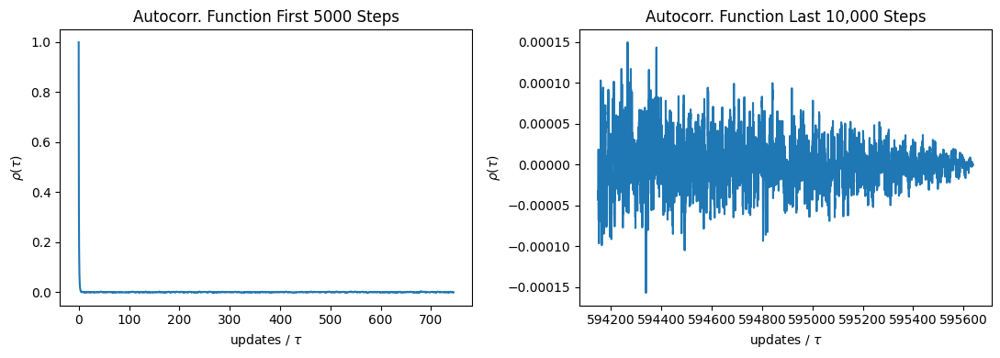

Estimated IAT:  [6.71548588]


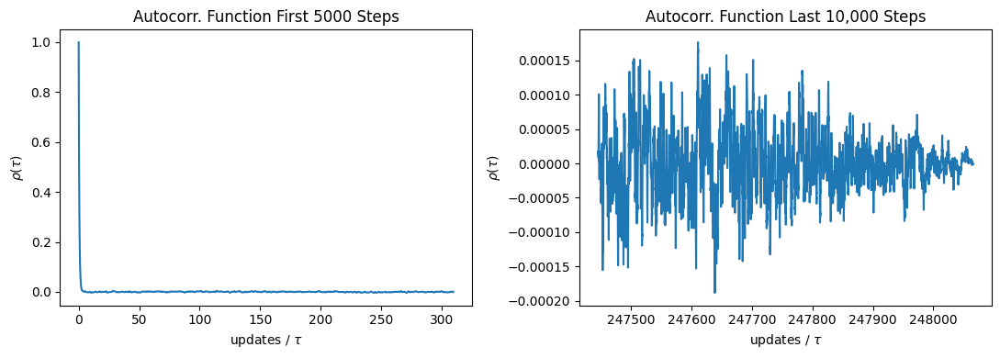

Estimated IAT:  [16.12475769]
[[0.07224335 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


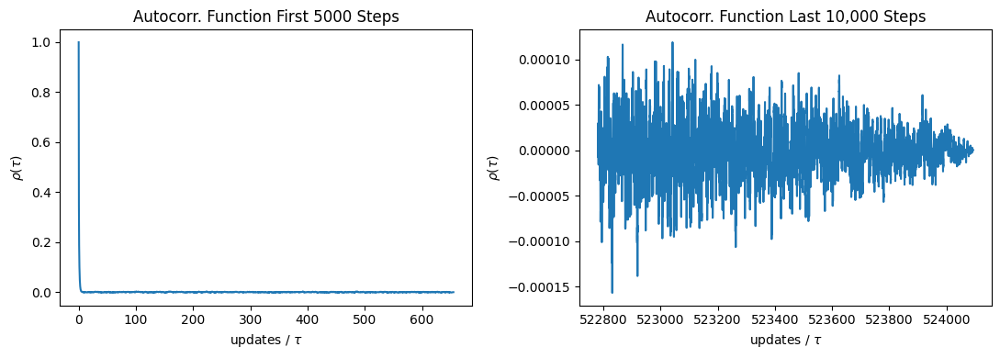

Estimated IAT:  [7.63223741]


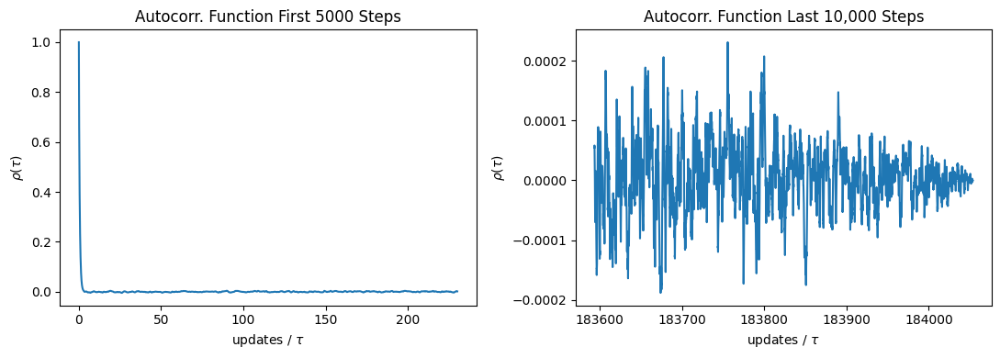

Estimated IAT:  [21.73279866]
[[0.05352113 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


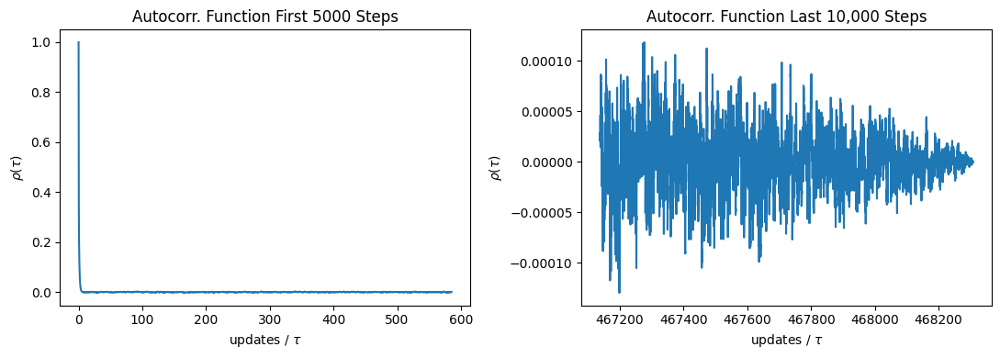

Estimated IAT:  [8.54137284]


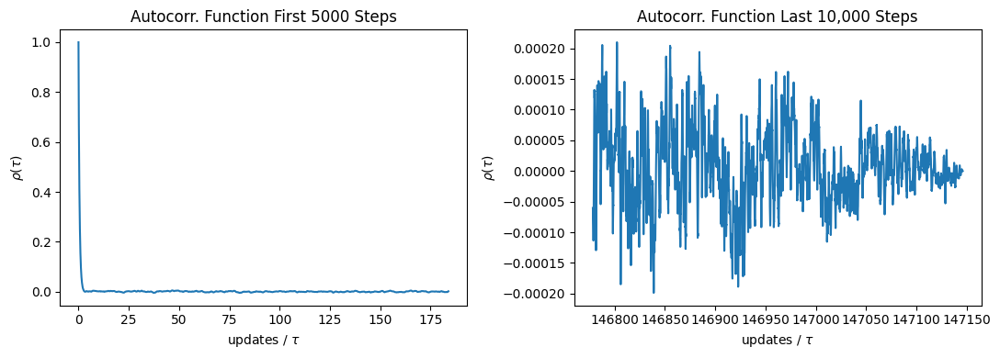

Estimated IAT:  [27.18384679]
[[0.04250559 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


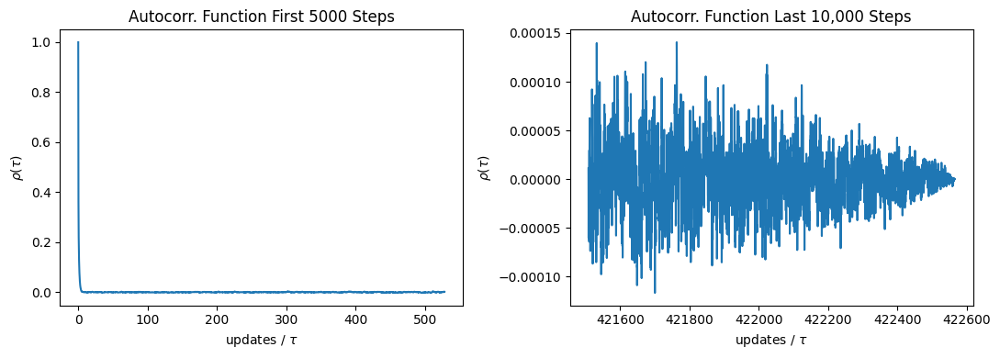

Estimated IAT:  [9.46600148]


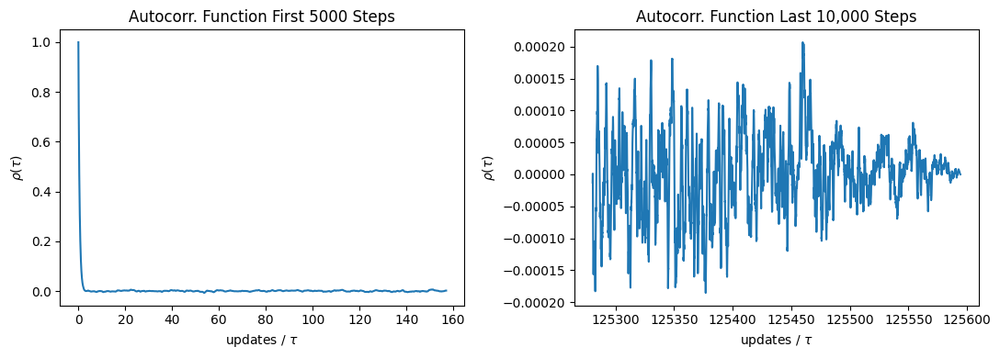

Estimated IAT:  [31.8485569]
[[0.03525046 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


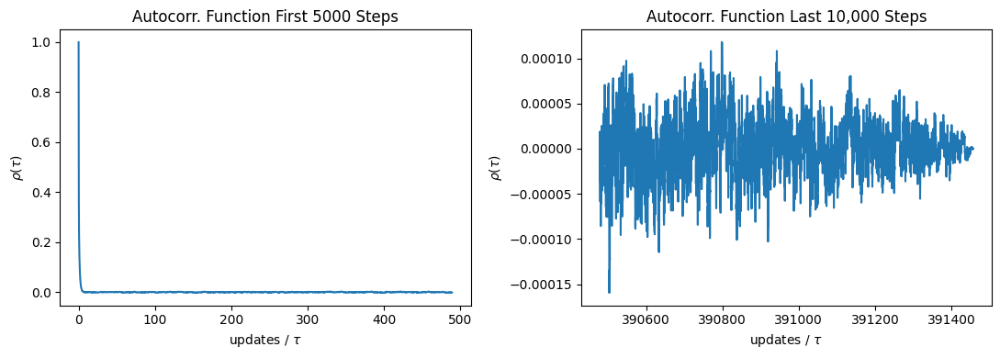

Estimated IAT:  [10.21823453]


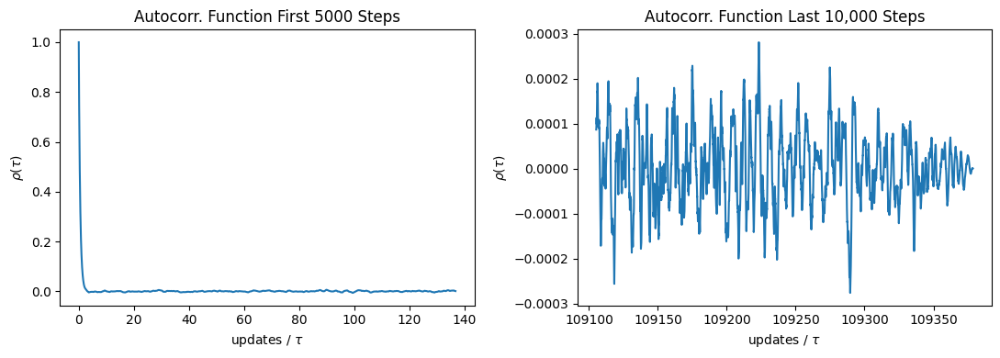

Estimated IAT:  [36.57020006]
[[0.03011094 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


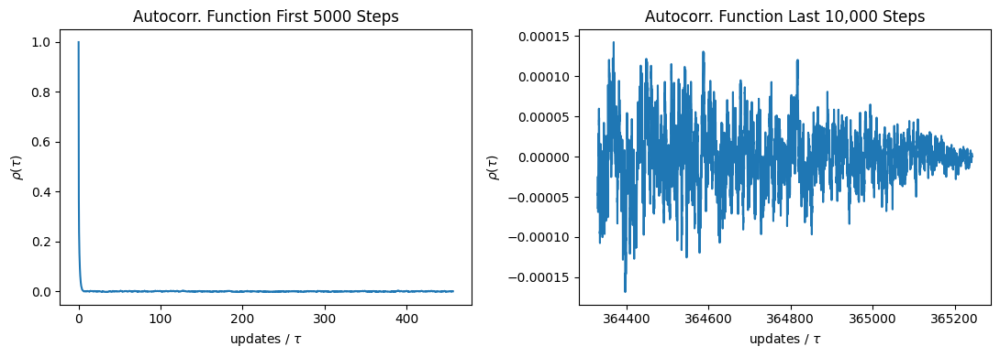

Estimated IAT:  [10.95162244]


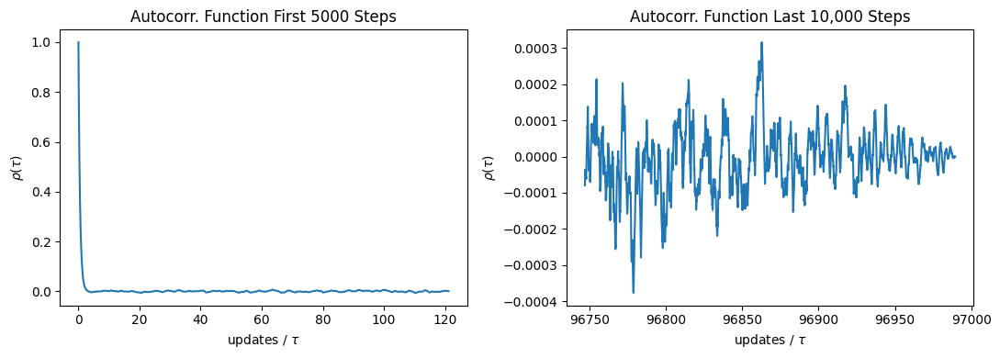

Estimated IAT:  [41.2415945]
[[0.02627939 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


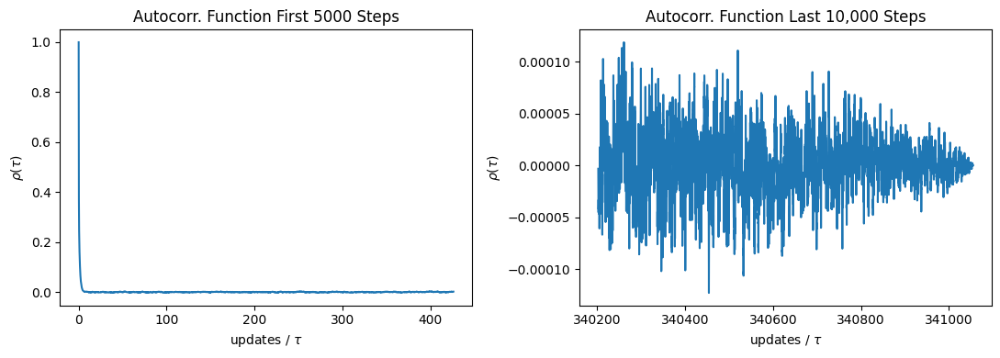

Estimated IAT:  [11.72831606]


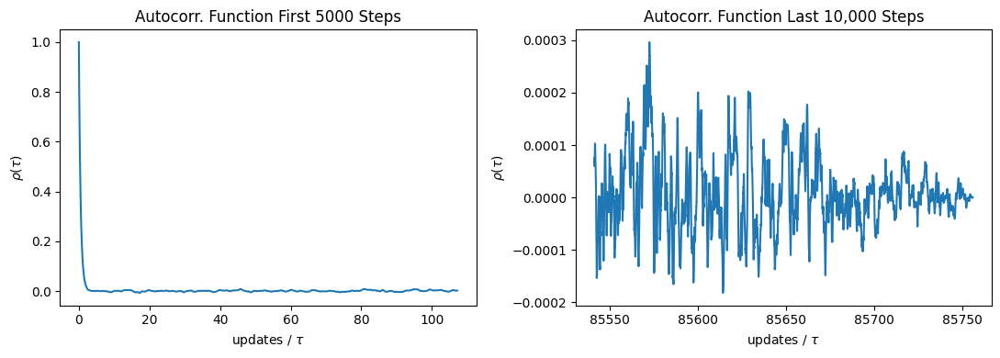

Estimated IAT:  [46.64407072]
[[0.02331288 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


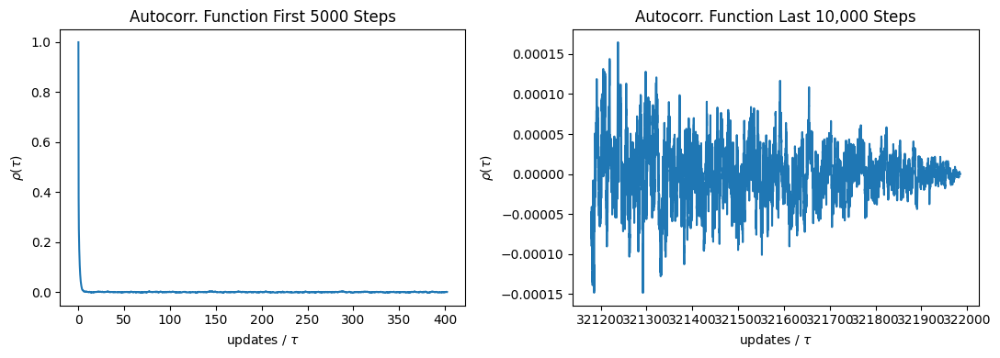

Estimated IAT:  [12.42295915]


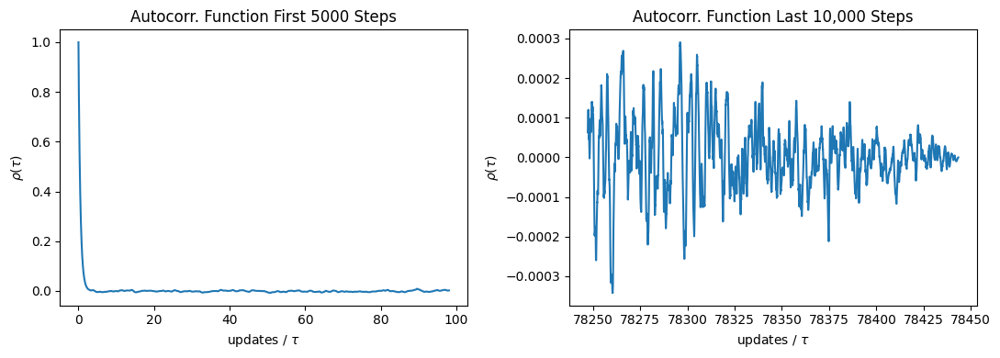

Estimated IAT:  [50.9922069]
[[0.02094818 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


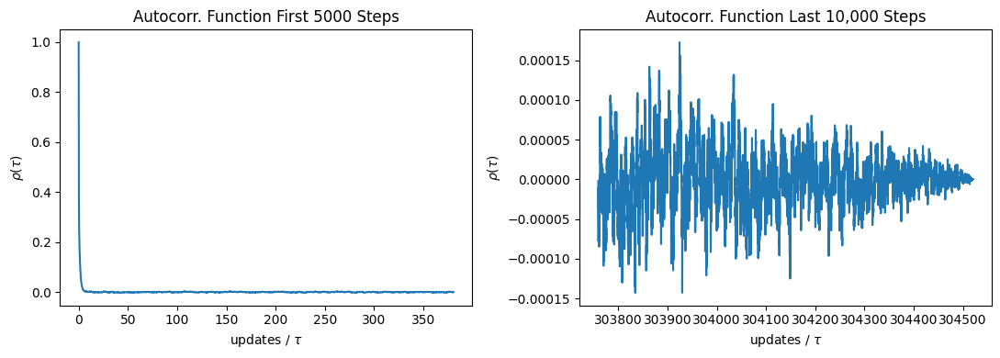

Estimated IAT:  [13.13539947]


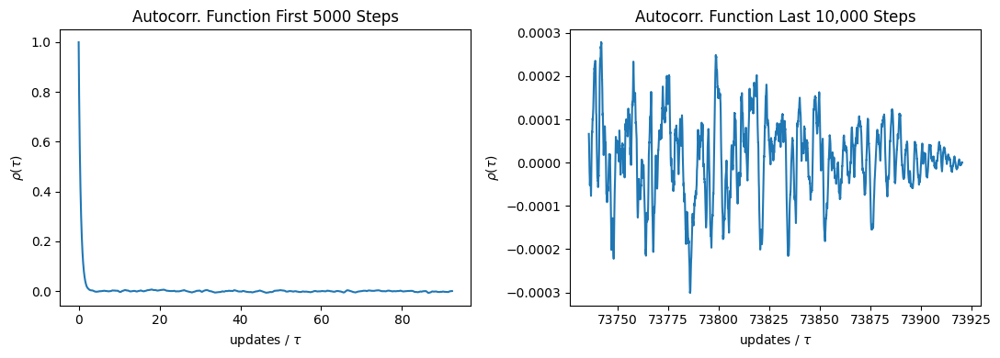

Estimated IAT:  [54.11211681]
[[0.01901902 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


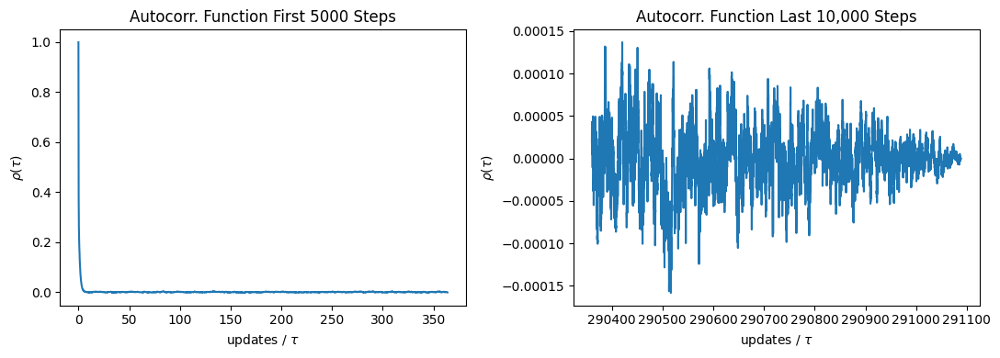

Estimated IAT:  [13.741526]


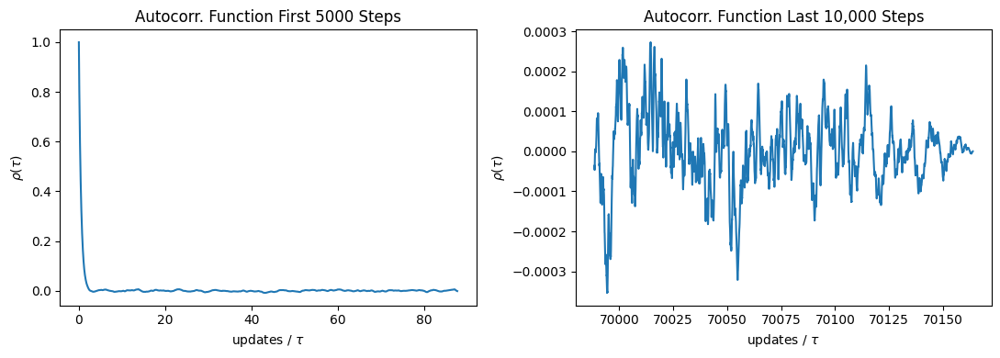

Estimated IAT:  [57.00939237]
[[0.01741522 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


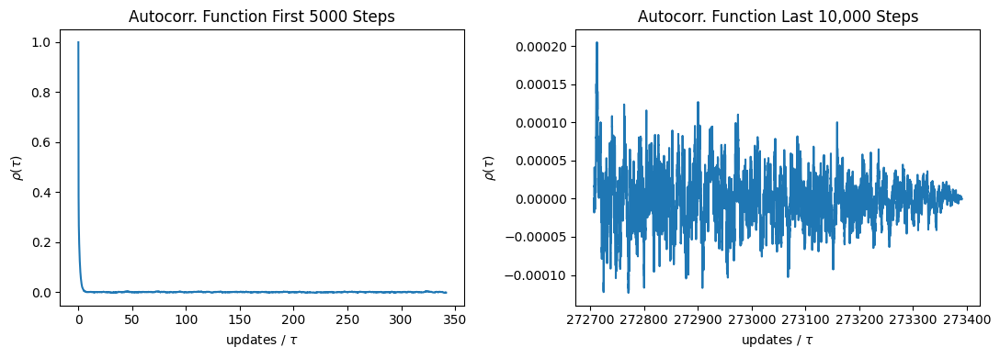

Estimated IAT:  [14.63108724]


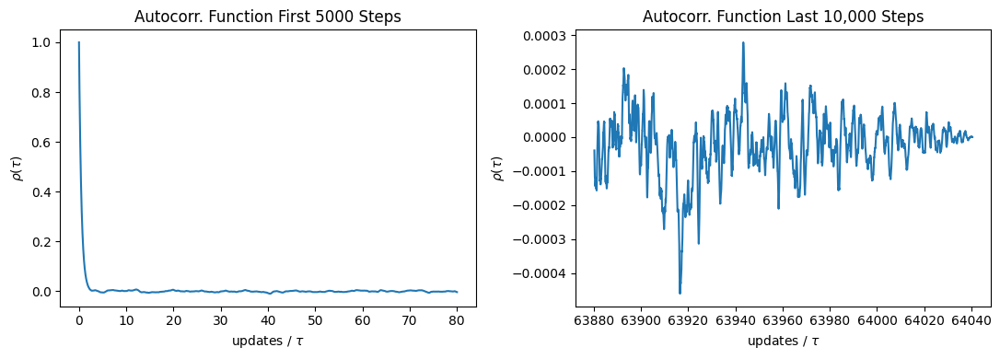

Estimated IAT:  [62.46058884]
[[0.01606086 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


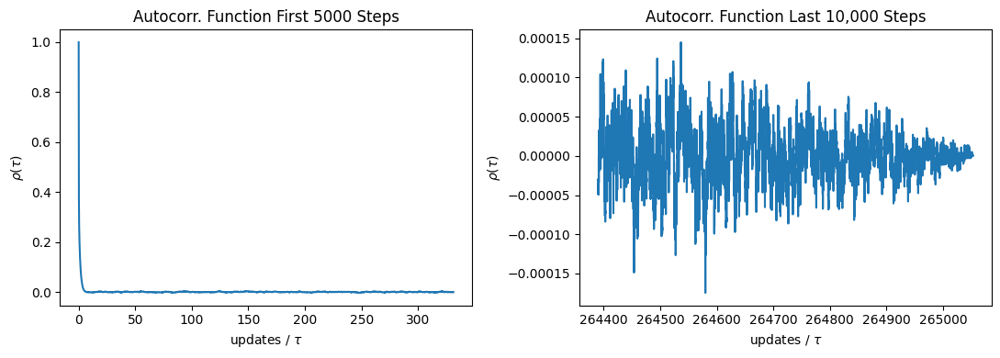

Estimated IAT:  [15.09131237]


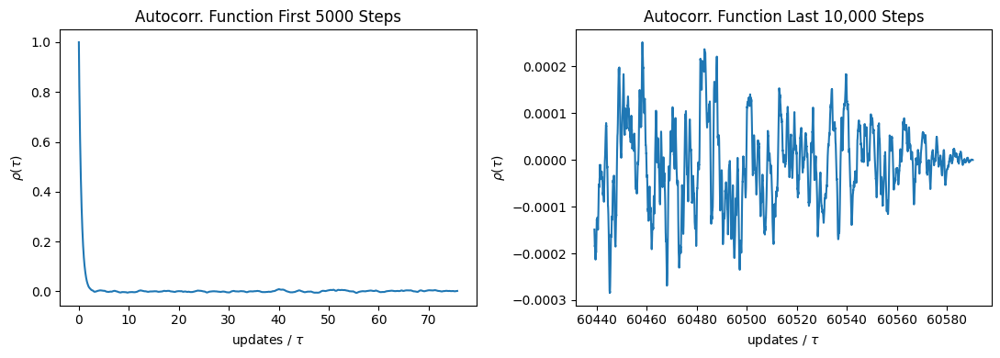

Estimated IAT:  [66.01696731]
[[0.01490196 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


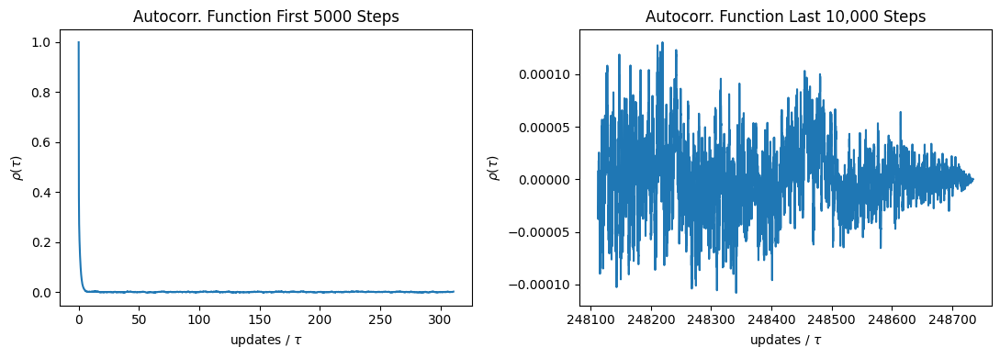

Estimated IAT:  [16.08140425]


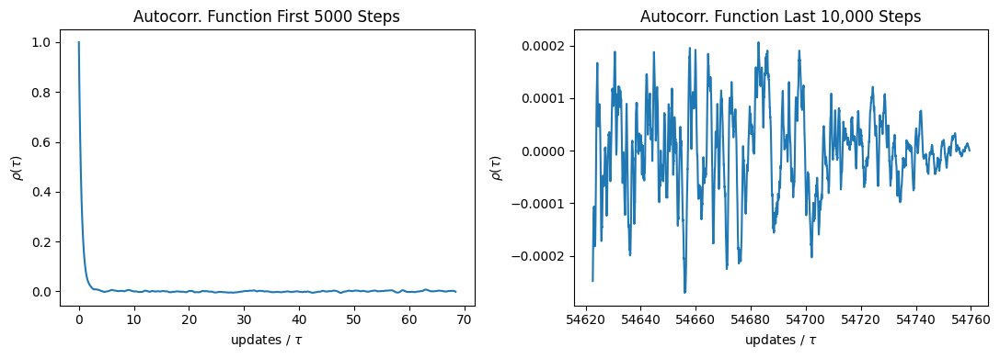

Estimated IAT:  [73.04670765]
[[0.01389905 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


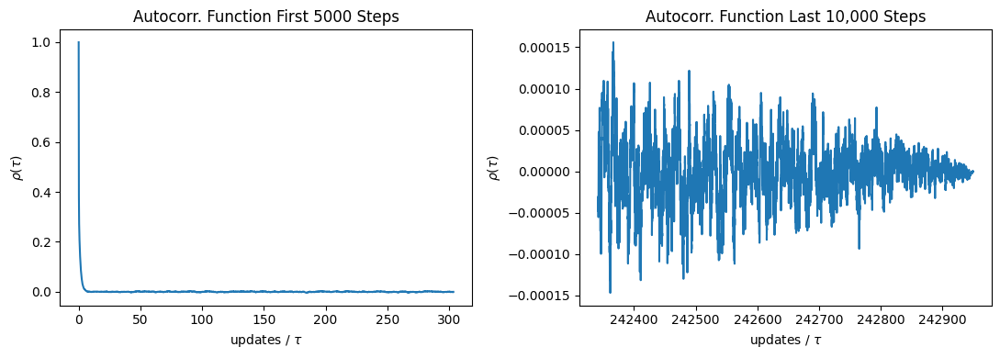

Estimated IAT:  [16.46433402]


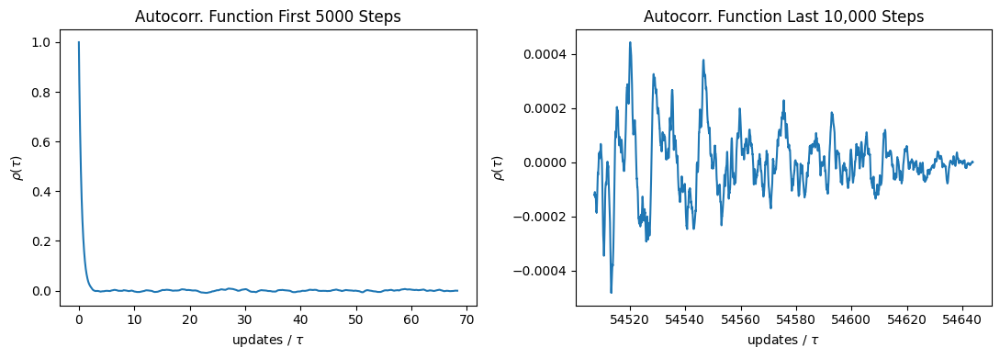

Estimated IAT:  [73.20132684]
[[0.01302262 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


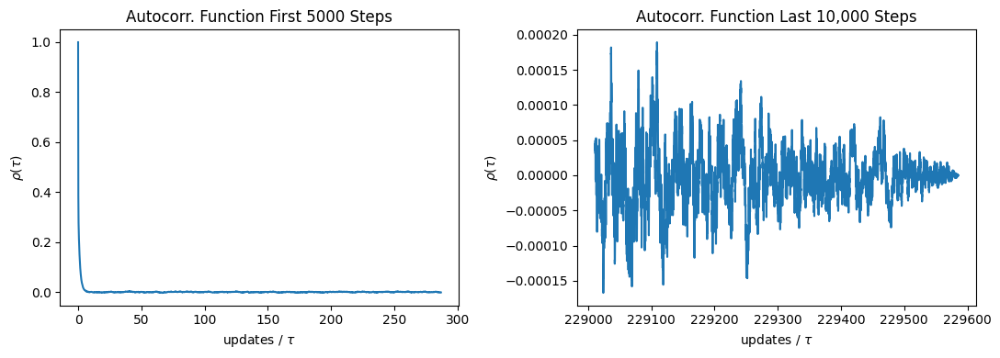

Estimated IAT:  [17.42271846]


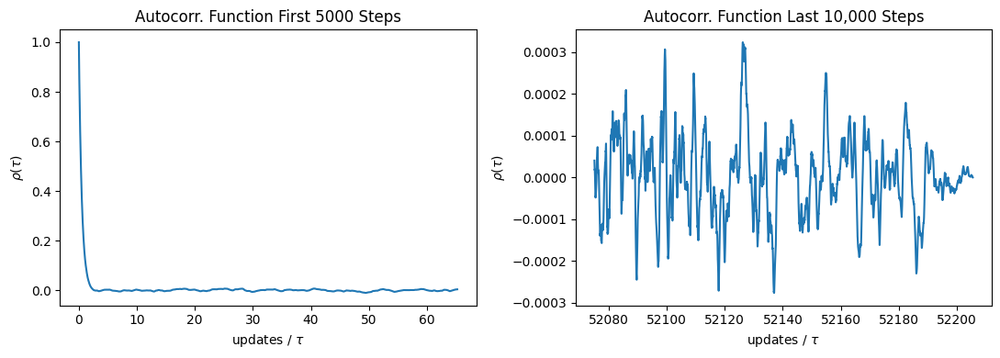

Estimated IAT:  [76.62019317]
[[0.01225016 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


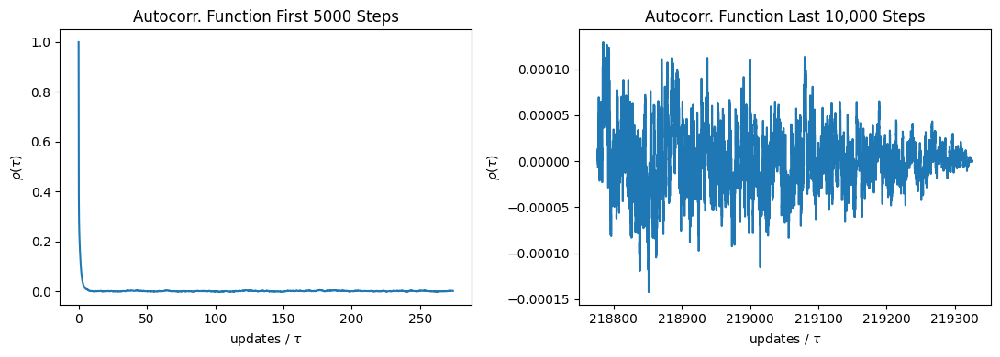

Estimated IAT:  [18.23775311]


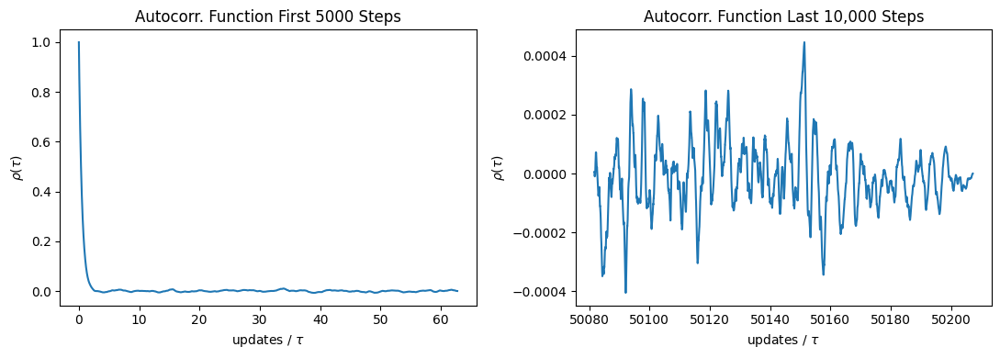

Estimated IAT:  [79.66980141]
[[0.01156421 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


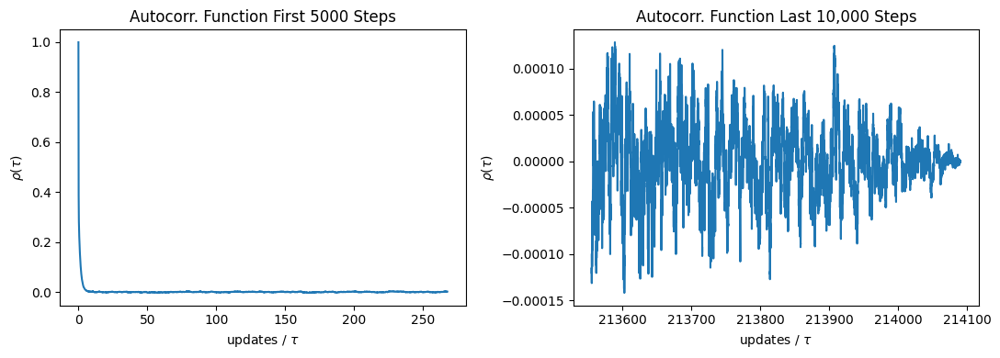

Estimated IAT:  [18.68366833]


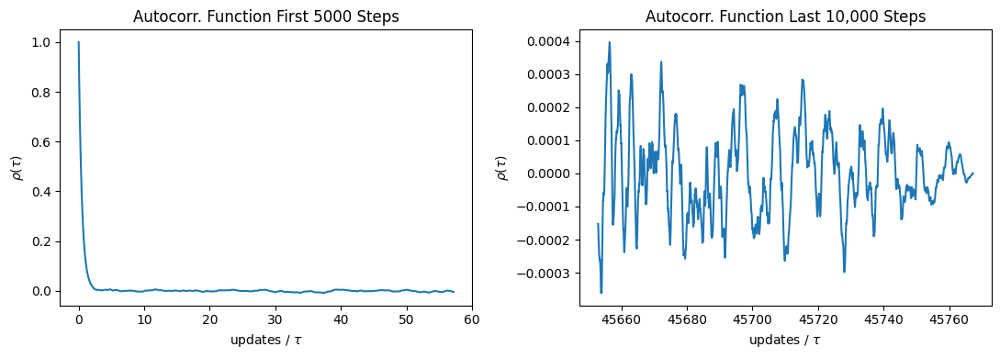

Estimated IAT:  [87.3986481]
[[0.01095101 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


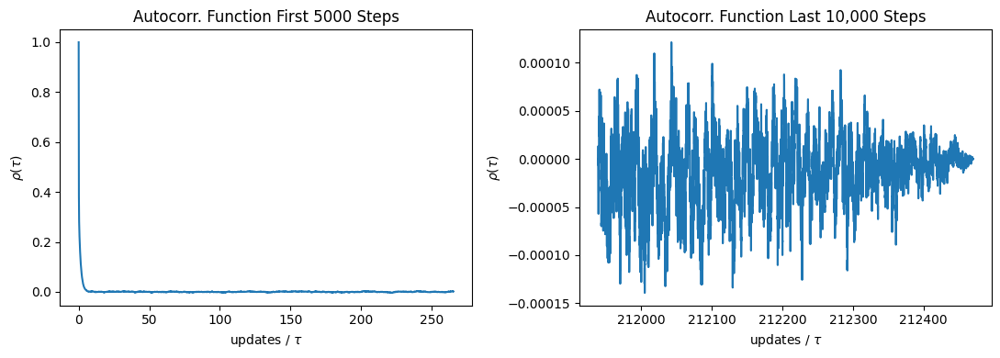

Estimated IAT:  [18.82617946]


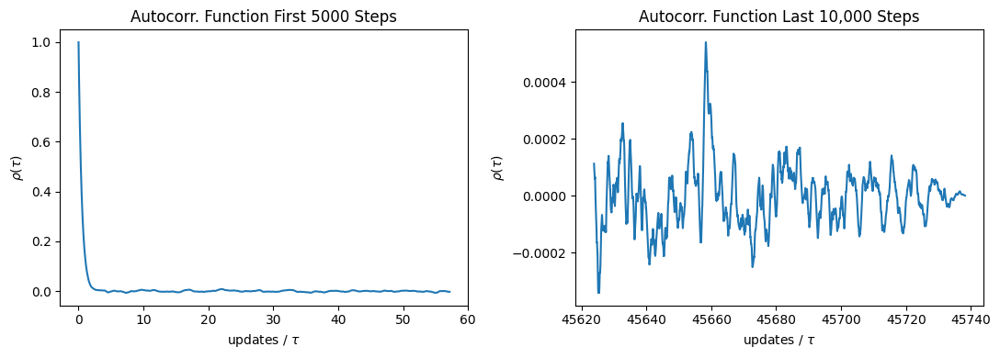

Estimated IAT:  [87.45420485]
[[0.01039956 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


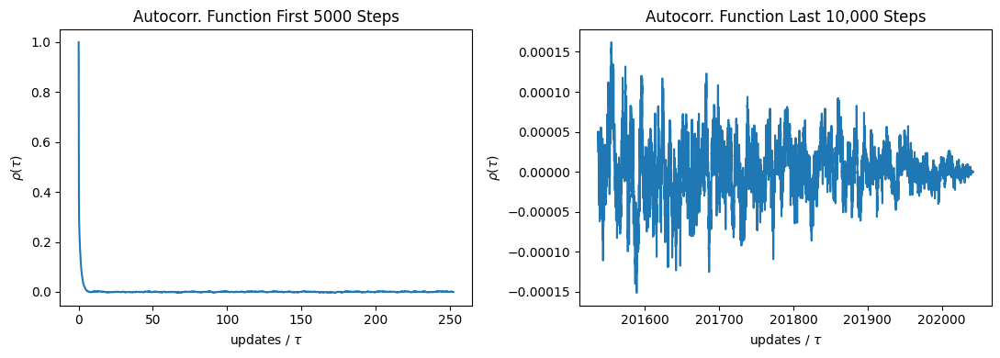

Estimated IAT:  [19.79785543]


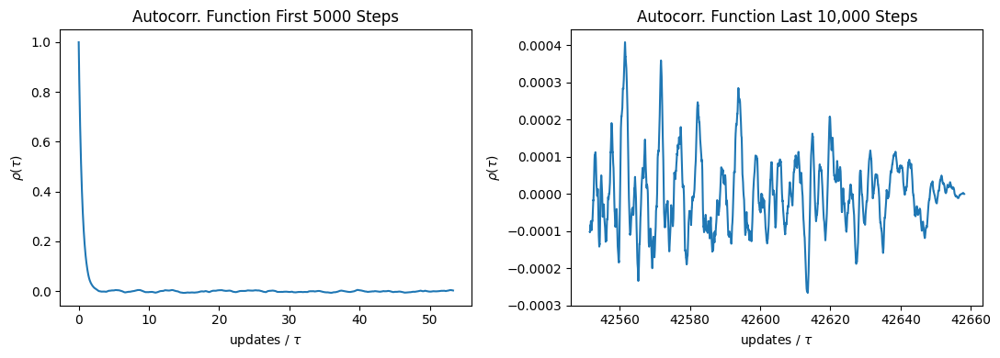

Estimated IAT:  [93.76873647]
[[0.00990099 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.        ]]


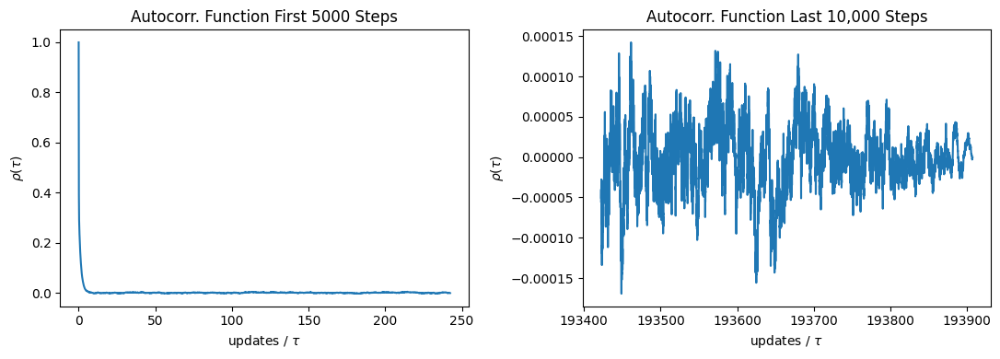

Estimated IAT:  [20.62842801]


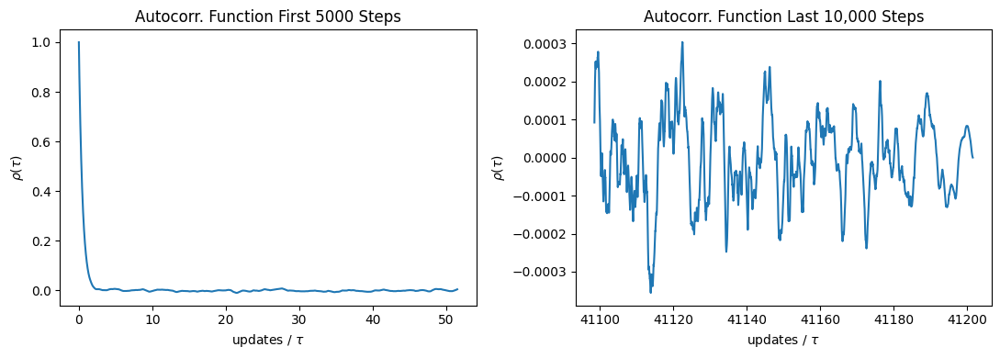

Estimated IAT:  [97.08360431]


In [32]:
alpha_li = np.linspace(9, 101, 20)
iat_r_li = []
iat_a_li = []
for alpha in alpha_li:
  var_li = np.array([alpha, 1, 1])
  samples_hit, C_inv, C_inv_root = multivar_normal_hit_2(5000000, var_li, np.zeros(3))
  f_tau_r, iat_r = iat(samples_hit, C_inv, "r", C_inv_root)
  iat_r_li.append(iat_r)
  f_tau_a, iat_a = iat(samples_hit, C_inv, "a", C_inv_root)
  iat_a_li.append(iat_a)

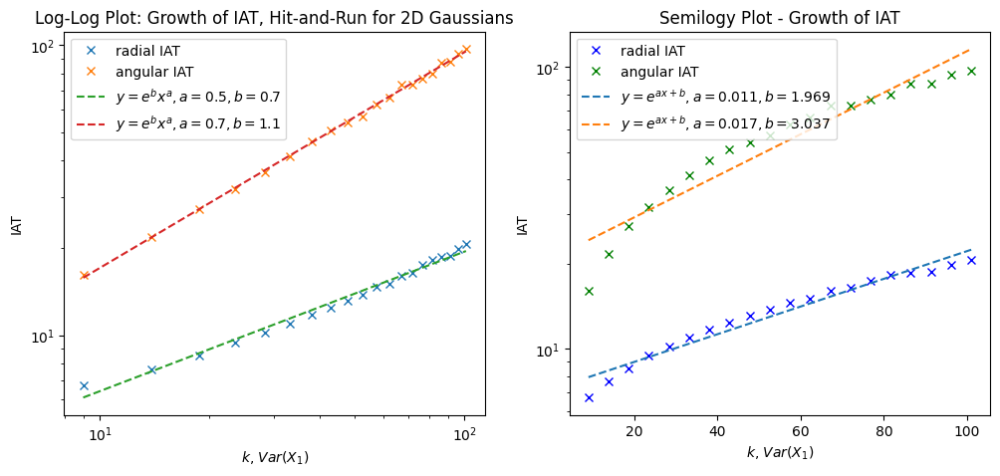

In [33]:
log_alpha = np.log(np.array(alpha_li))
log_iat_r = np.log(np.array(iat_r_li)).flatten()
log_iat_a = np.log(np.array(iat_a_li)).flatten()
fit_line = np.polyfit(log_alpha, log_iat_r, 1)
p = np.poly1d(fit_line)
fit_line_a = np.polyfit(log_alpha, log_iat_a, 1)
p_a = np.poly1d(fit_line_a)

fit_line_er = np.polyfit(np.array(alpha_li), log_iat_r, 1)
p_er = np.poly1d(fit_line_er)
fit_line_ea = np.polyfit(np.array(alpha_li), log_iat_a, 1)
p_ea = np.poly1d(fit_line_ea)

fig = plt.figure(figsize=(12,5))
ax = fig.add_subplot(1,2,1)
ax.loglog(alpha_li, iat_r_li, 'x', label="radial IAT")
ax.loglog(alpha_li, iat_a_li, 'x', label="angular IAT")
ax.loglog(alpha_li, np.exp(p(log_alpha)), '--', label=r"$y = e^{{b}}x^{{a}}, a = {a}, b = {b}$".format(a = round(fit_line[0], 1), b = round(fit_line[1], 1)))
ax.loglog(alpha_li, np.exp(p_a(log_alpha)), '--', label=r"$y = e^{{b}}x^{{a}}, a = {a}, b = {b}$".format(a = round(fit_line_a[0], 1), b = round(fit_line_a[1], 1)))
ax.legend()
ax.set_xlabel(r"$k$, $Var(X_1)$")
ax.set_ylabel(r"IAT")
ax.set_title(r"Log-Log Plot: Growth of IAT, Hit-and-Run for 2D Gaussians")
ax_2 = fig.add_subplot(1,2,2)
ax_2.semilogy(alpha_li, iat_r_li, 'bx', label="radial IAT")
ax_2.semilogy(alpha_li, iat_a_li, 'gx', label="angular IAT")
ax_2.semilogy(alpha_li, np.exp(p_er(np.array(alpha_li))), '--', label=r"$y = e^{{ax+b}}, a = {a}, b = {b}$".format(a = round(fit_line_er[0], 3), b = round(fit_line_er[1], 3)))
ax_2.semilogy(alpha_li, np.exp(p_ea(np.array(alpha_li))), '--', label=r"$y = e^{{ax+b}}, a = {a}, b = {b}$".format(a = round(fit_line_ea[0], 3), b = round(fit_line_ea[1], 3)))
ax_2.legend()
ax_2.set_xlabel(r"$k$, $Var(X_1)$")
ax_2.set_ylabel(r"IAT")
ax_2.set_title(r"Semilogy Plot - Growth of IAT")
plt.show()

[[0.11111111 0.         0.        ]
 [0.         0.11111111 0.        ]
 [0.         0.         1.        ]]


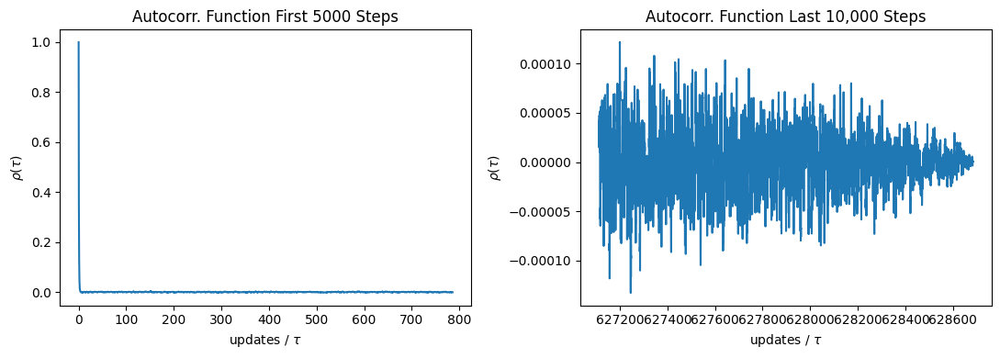

Estimated IAT:  [6.3624911]


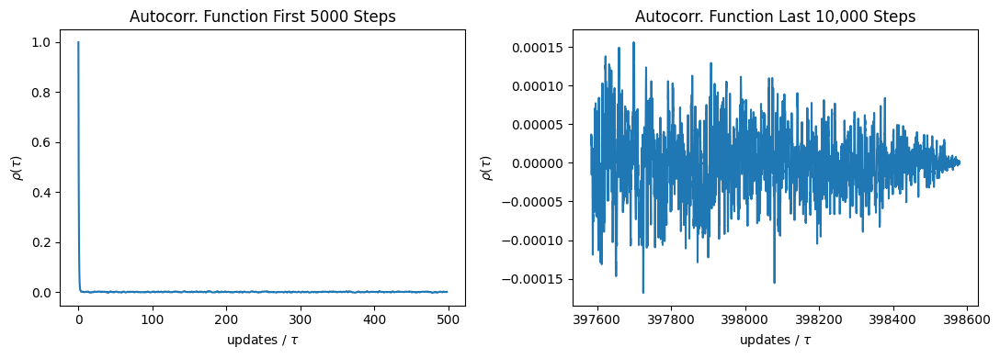

Estimated IAT:  [10.0356191]
[[0.07224335 0.         0.        ]
 [0.         0.07224335 0.        ]
 [0.         0.         1.        ]]


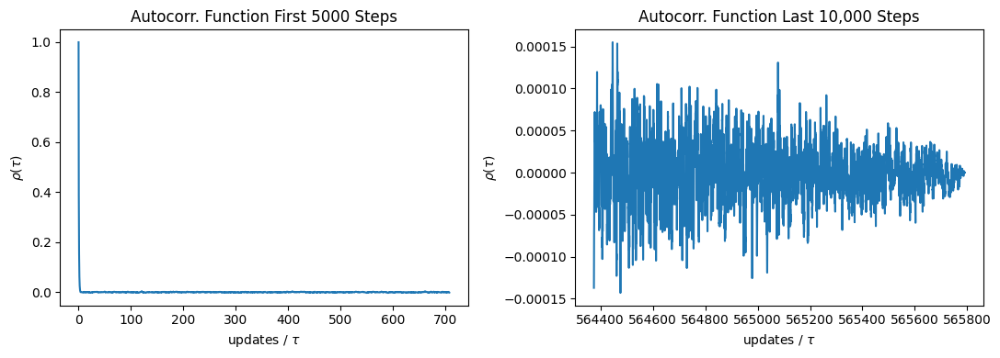

Estimated IAT:  [7.06976155]


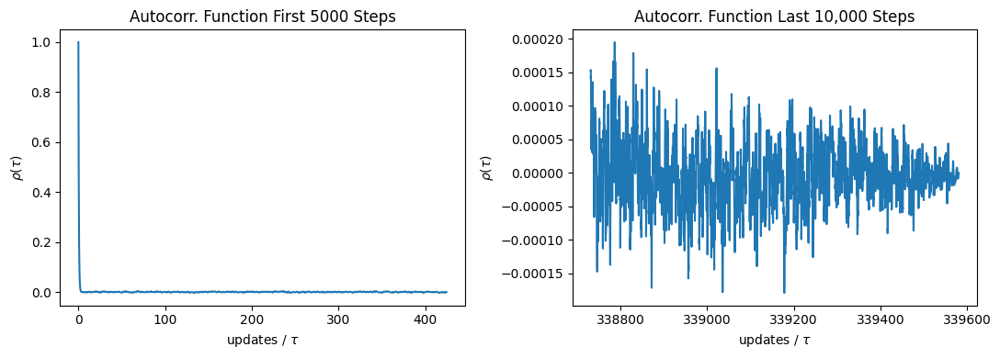

Estimated IAT:  [11.77922773]
[[0.05352113 0.         0.        ]
 [0.         0.05352113 0.        ]
 [0.         0.         1.        ]]


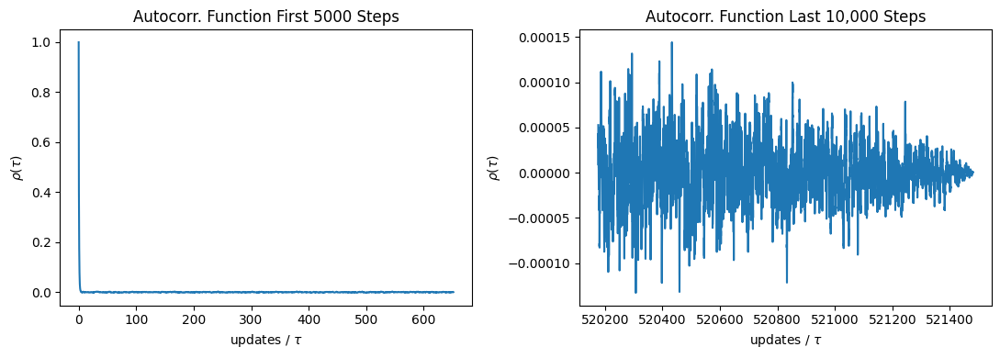

Estimated IAT:  [7.67047063]


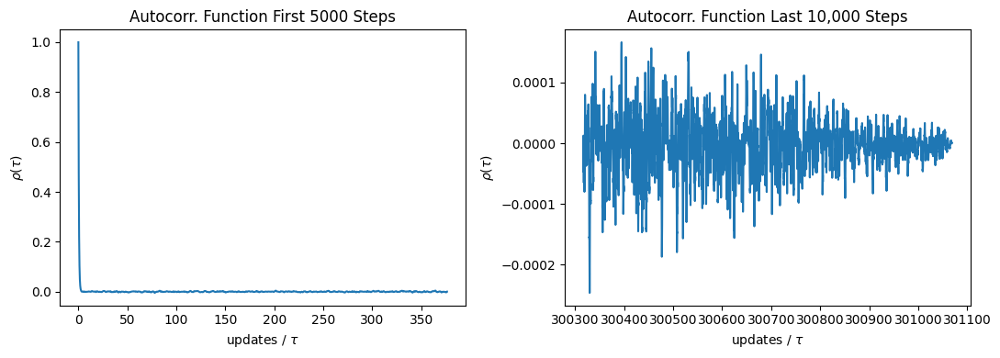

Estimated IAT:  [13.28599699]
[[0.04250559 0.         0.        ]
 [0.         0.04250559 0.        ]
 [0.         0.         1.        ]]


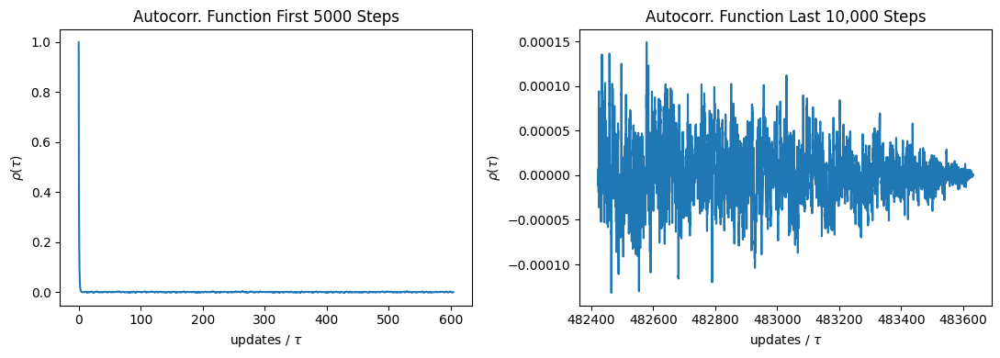

Estimated IAT:  [8.27075257]


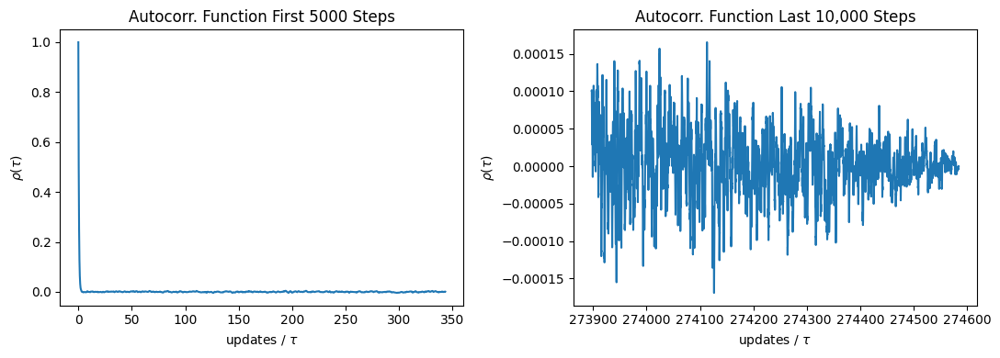

Estimated IAT:  [14.56750073]
[[0.03525046 0.         0.        ]
 [0.         0.03525046 0.        ]
 [0.         0.         1.        ]]


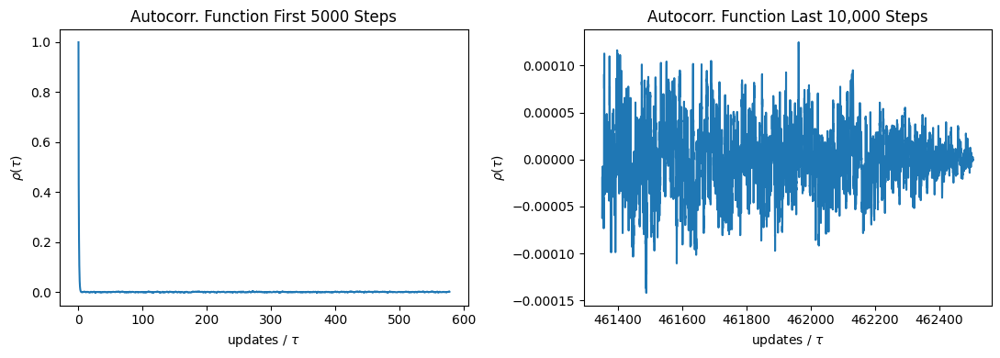

Estimated IAT:  [8.64852115]


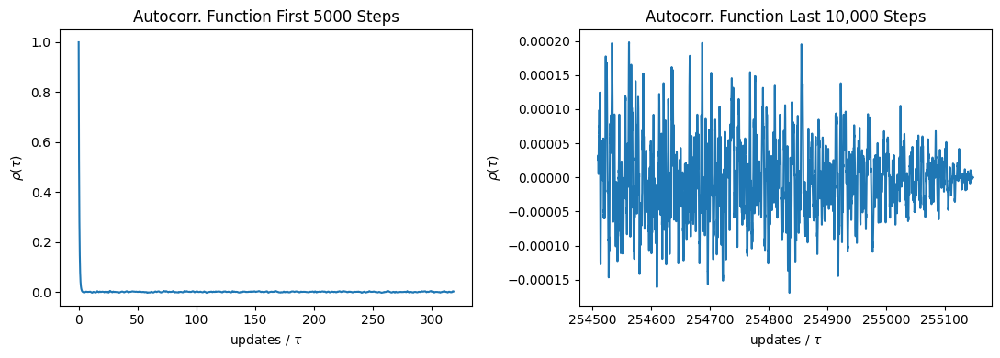

Estimated IAT:  [15.67716313]
[[0.03011094 0.         0.        ]
 [0.         0.03011094 0.        ]
 [0.         0.         1.        ]]


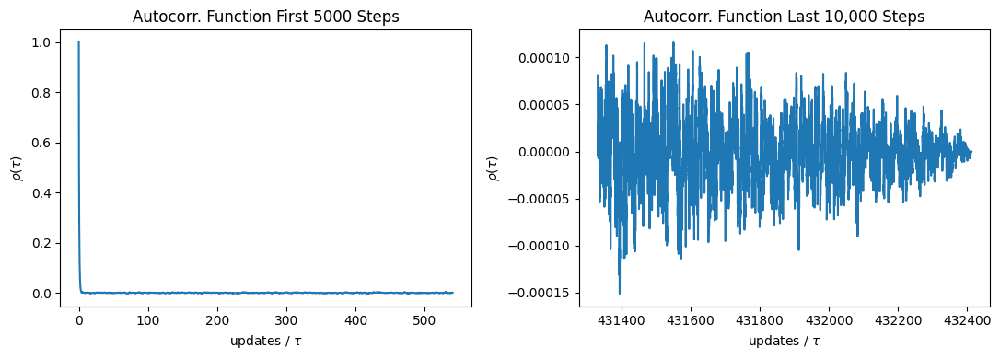

Estimated IAT:  [9.25042545]


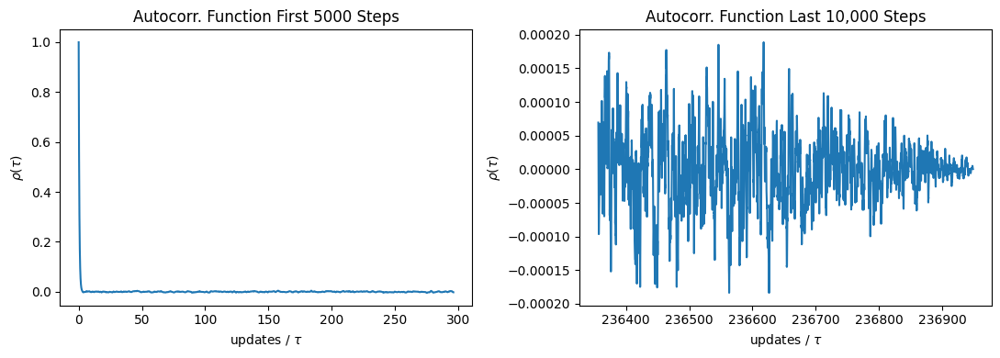

Estimated IAT:  [16.88128943]
[[0.02627939 0.         0.        ]
 [0.         0.02627939 0.        ]
 [0.         0.         1.        ]]


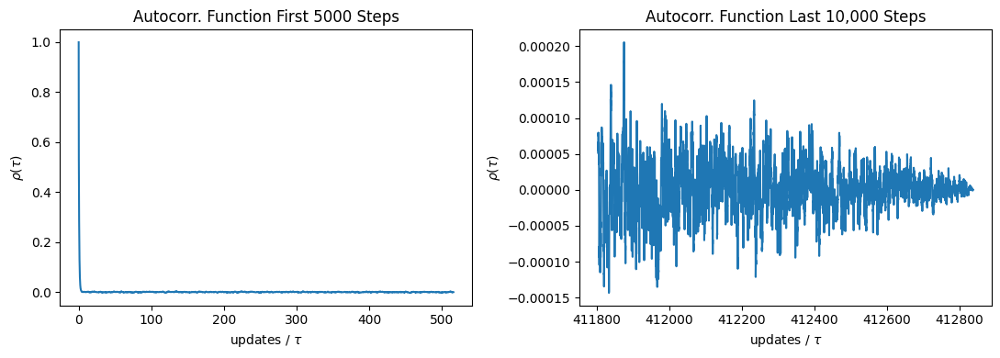

Estimated IAT:  [9.68905271]


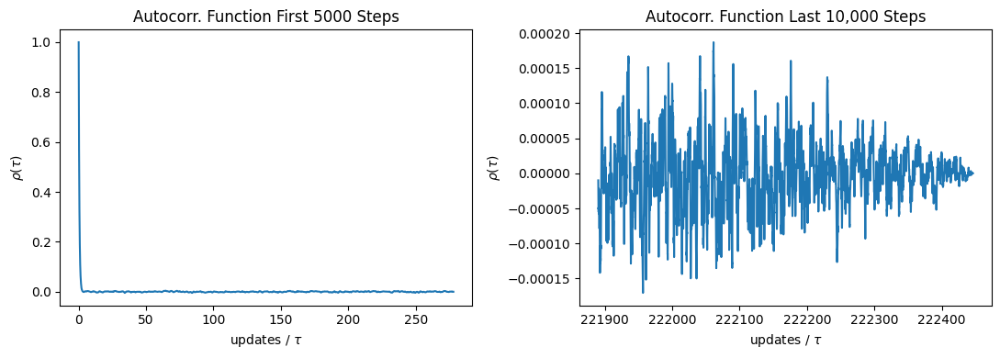

Estimated IAT:  [17.98186797]
[[0.02331288 0.         0.        ]
 [0.         0.02331288 0.        ]
 [0.         0.         1.        ]]


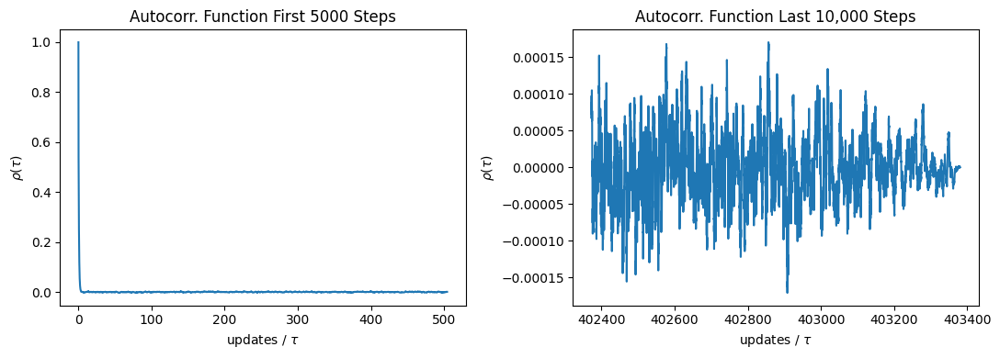

Estimated IAT:  [9.91618299]


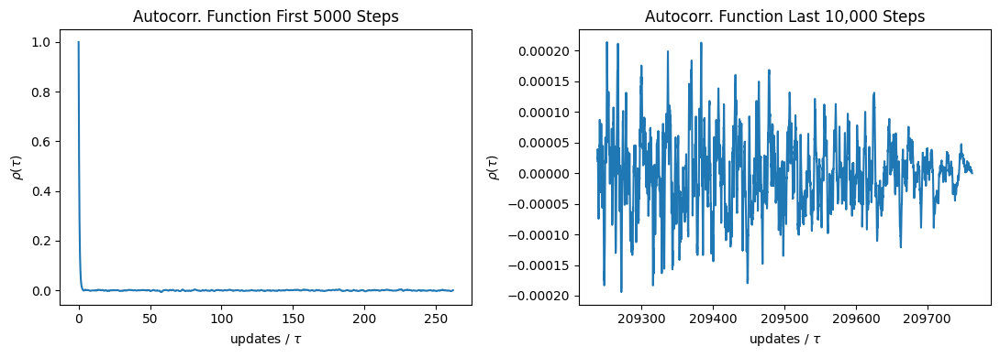

Estimated IAT:  [19.06915175]
[[0.02094818 0.         0.        ]
 [0.         0.02094818 0.        ]
 [0.         0.         1.        ]]


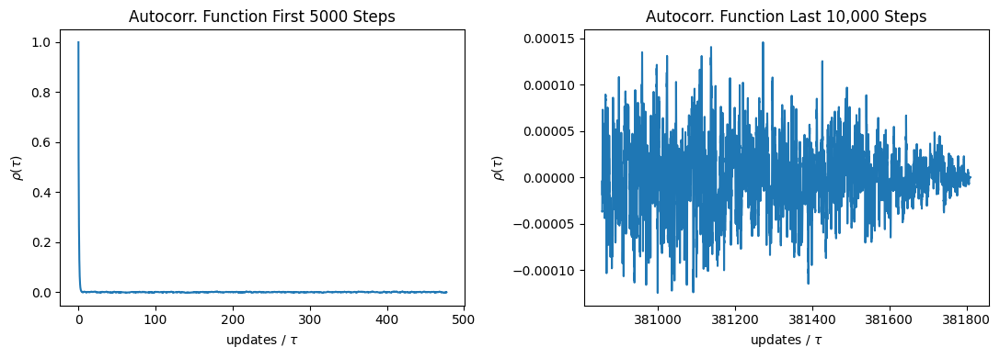

Estimated IAT:  [10.47642484]


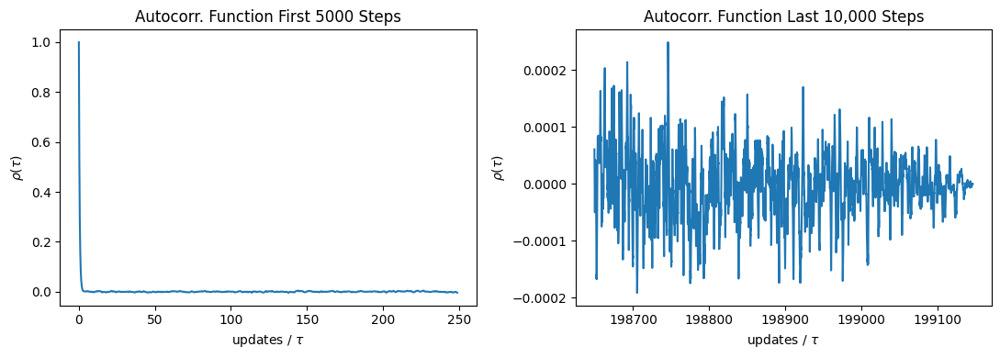

Estimated IAT:  [20.08566943]
[[0.01901902 0.         0.        ]
 [0.         0.01901902 0.        ]
 [0.         0.         1.        ]]


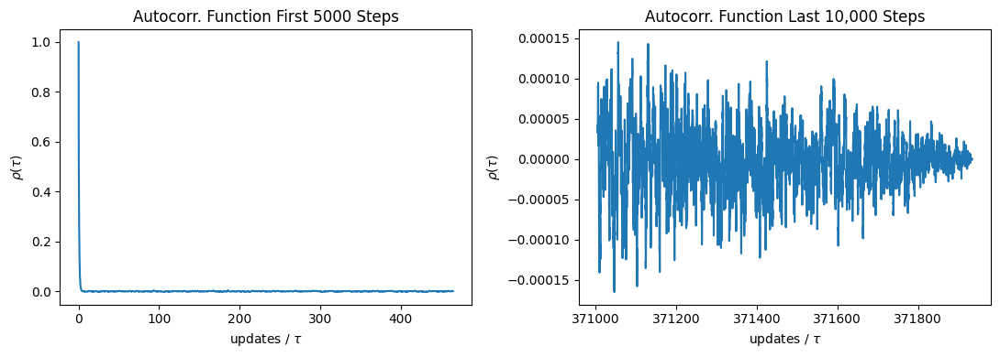

Estimated IAT:  [10.7545814]


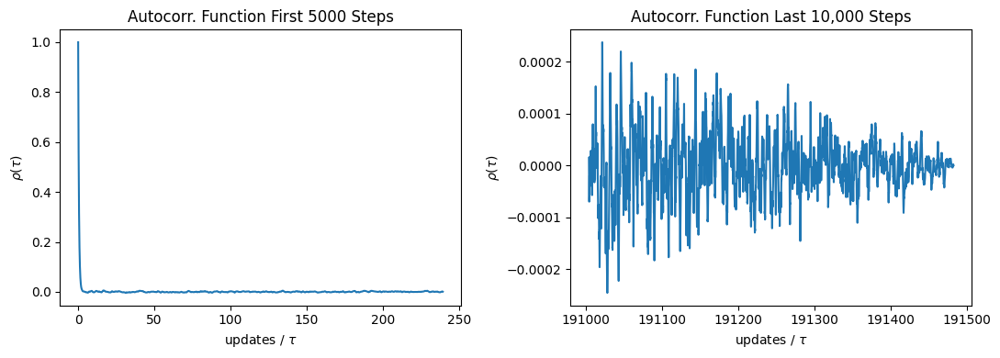

Estimated IAT:  [20.88963532]
[[0.01741522 0.         0.        ]
 [0.         0.01741522 0.        ]
 [0.         0.         1.        ]]


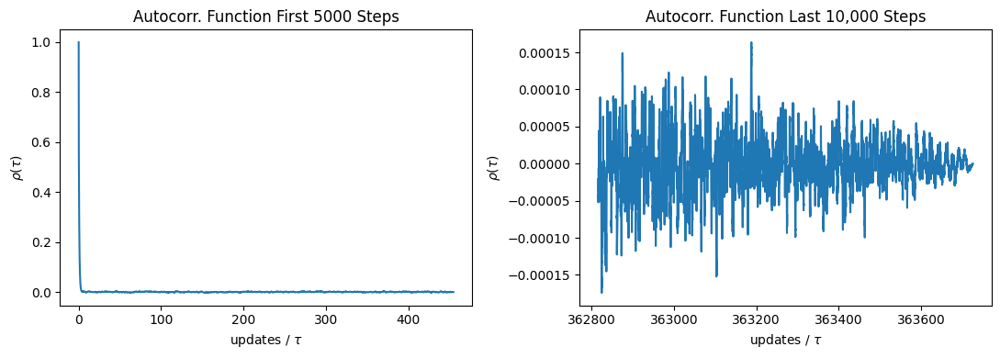

Estimated IAT:  [10.99729863]


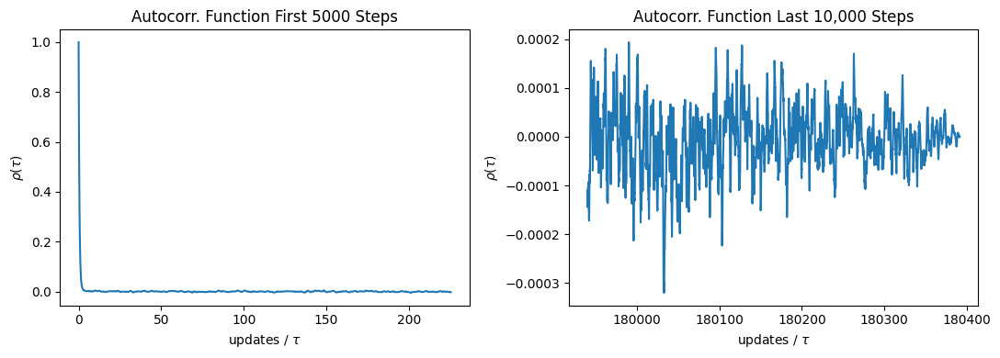

Estimated IAT:  [22.17401422]
[[0.01606086 0.         0.        ]
 [0.         0.01606086 0.        ]
 [0.         0.         1.        ]]


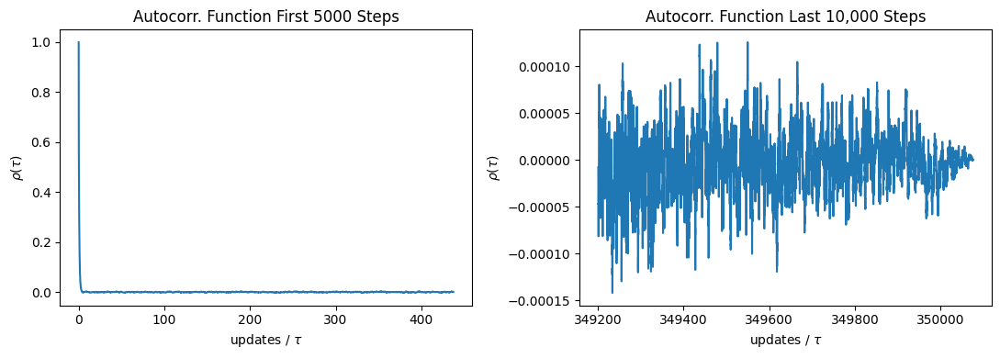

Estimated IAT:  [11.42609139]


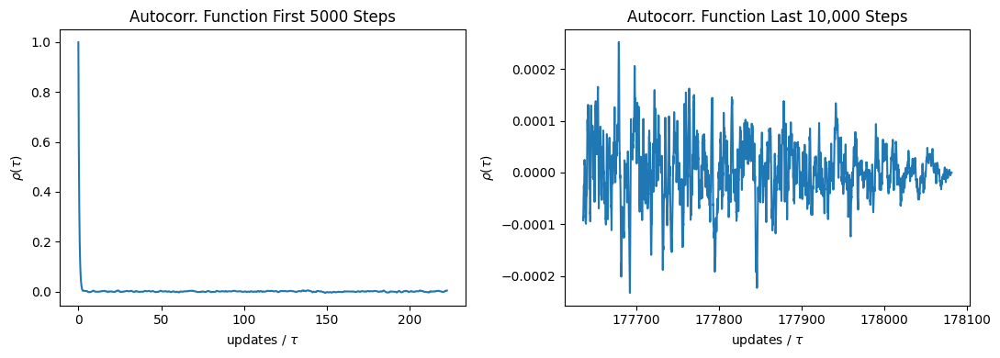

Estimated IAT:  [22.46164121]
[[0.01490196 0.         0.        ]
 [0.         0.01490196 0.        ]
 [0.         0.         1.        ]]


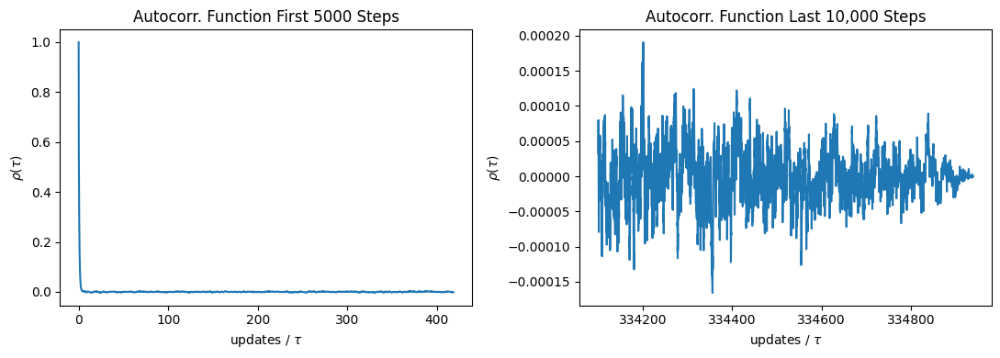

Estimated IAT:  [11.94249509]


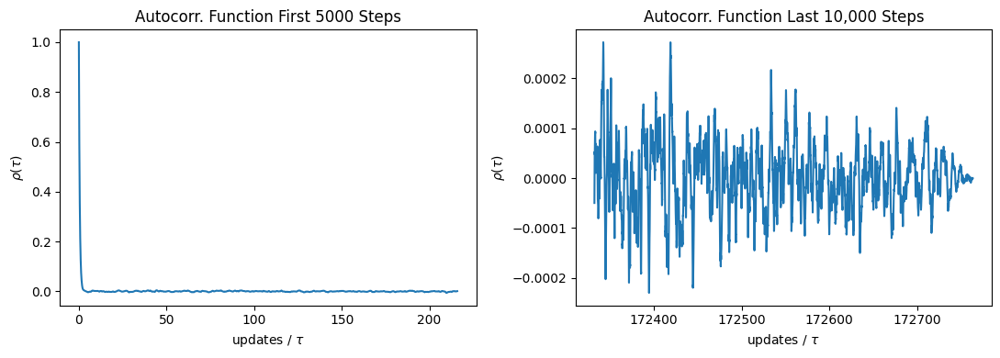

Estimated IAT:  [23.1529902]
[[0.01389905 0.         0.        ]
 [0.         0.01389905 0.        ]
 [0.         0.         1.        ]]


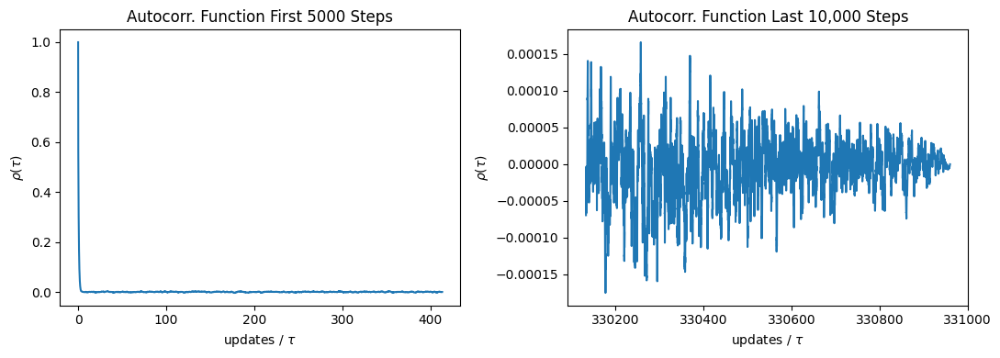

Estimated IAT:  [12.08603814]


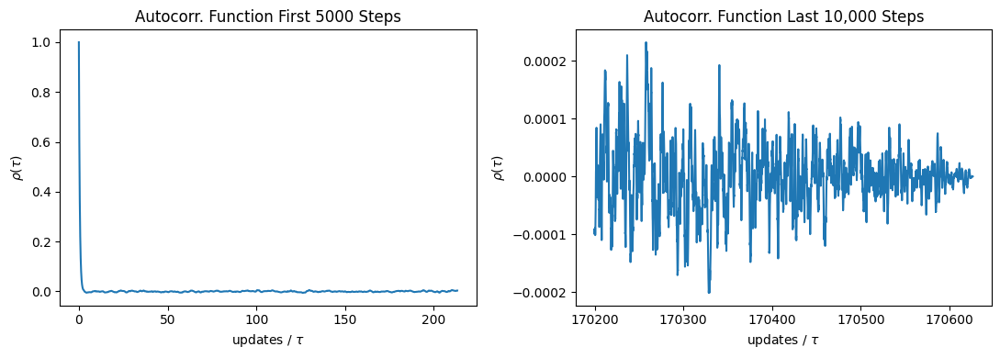

Estimated IAT:  [23.44303757]
[[0.01302262 0.         0.        ]
 [0.         0.01302262 0.        ]
 [0.         0.         1.        ]]


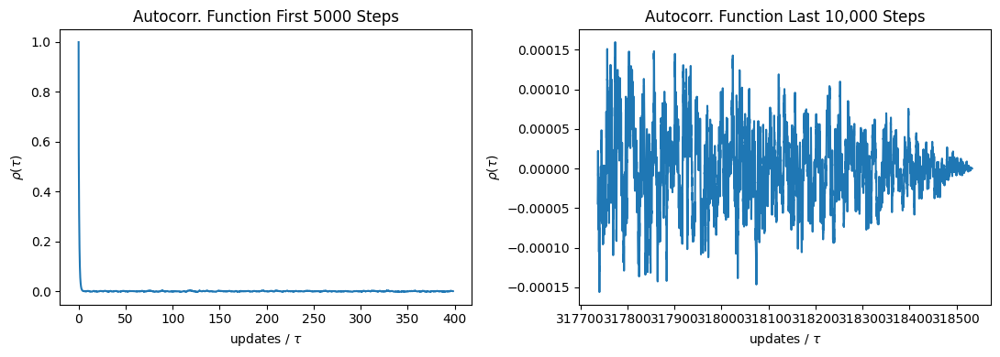

Estimated IAT:  [12.55756482]


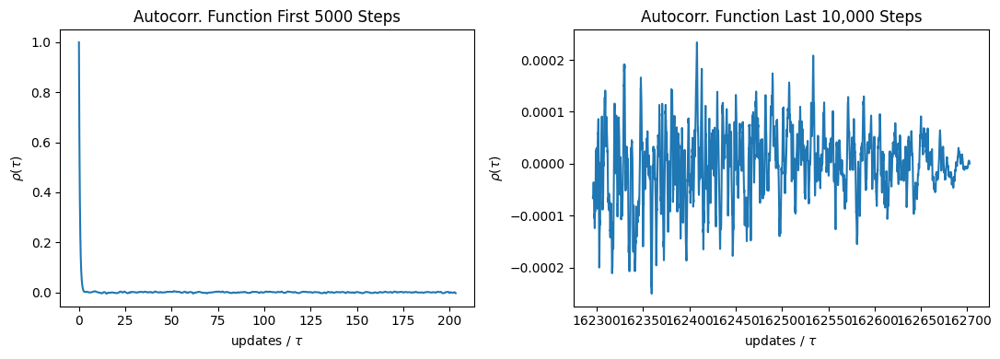

Estimated IAT:  [24.58472518]
[[0.01225016 0.         0.        ]
 [0.         0.01225016 0.        ]
 [0.         0.         1.        ]]


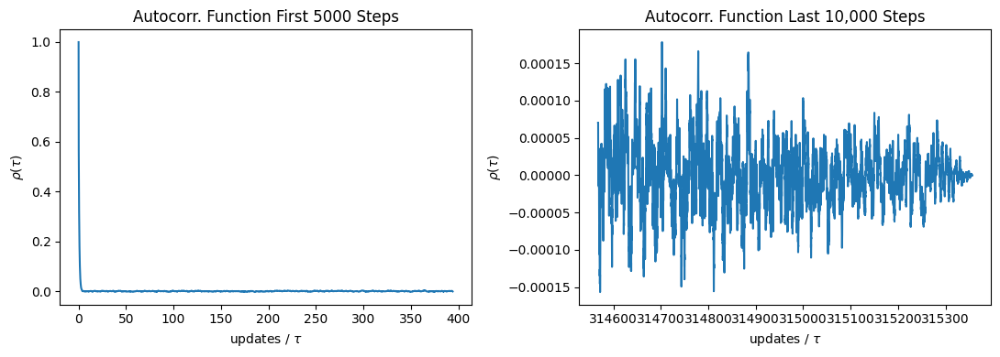

Estimated IAT:  [12.68407435]


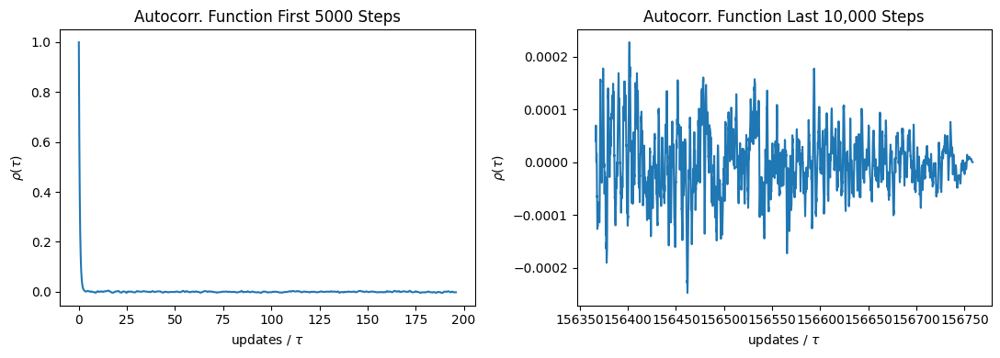

Estimated IAT:  [25.51695489]
[[0.01156421 0.         0.        ]
 [0.         0.01156421 0.        ]
 [0.         0.         1.        ]]


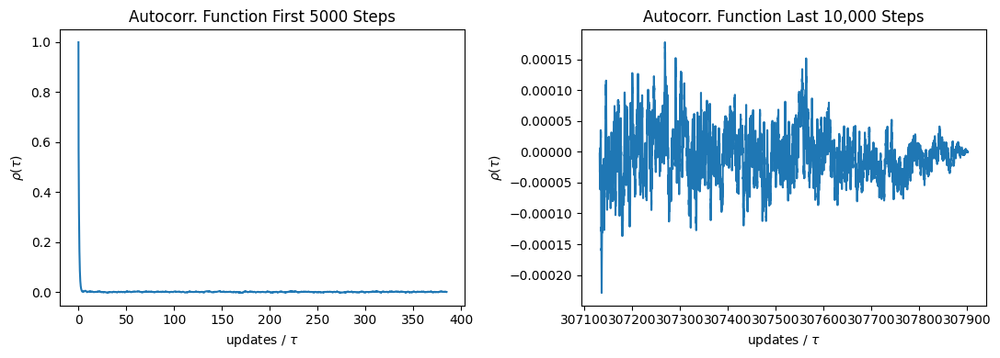

Estimated IAT:  [12.99115928]


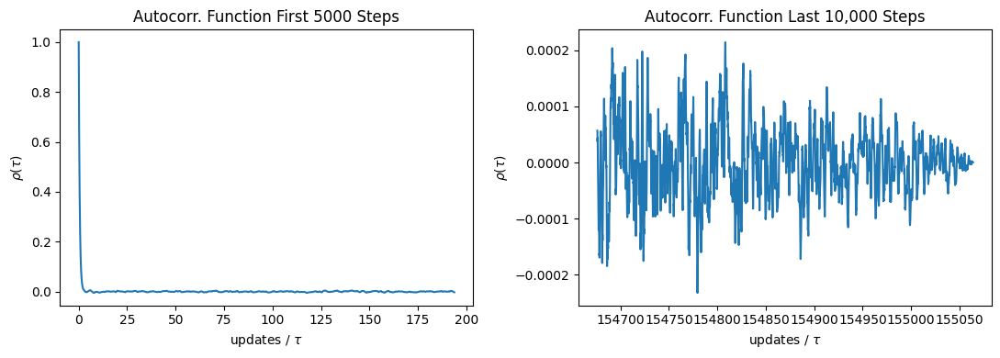

Estimated IAT:  [25.79581827]
[[0.01095101 0.         0.        ]
 [0.         0.01095101 0.        ]
 [0.         0.         1.        ]]


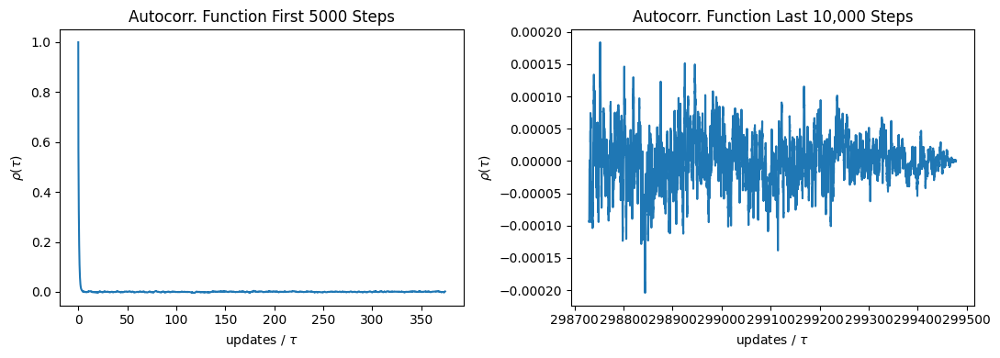

Estimated IAT:  [13.35655422]


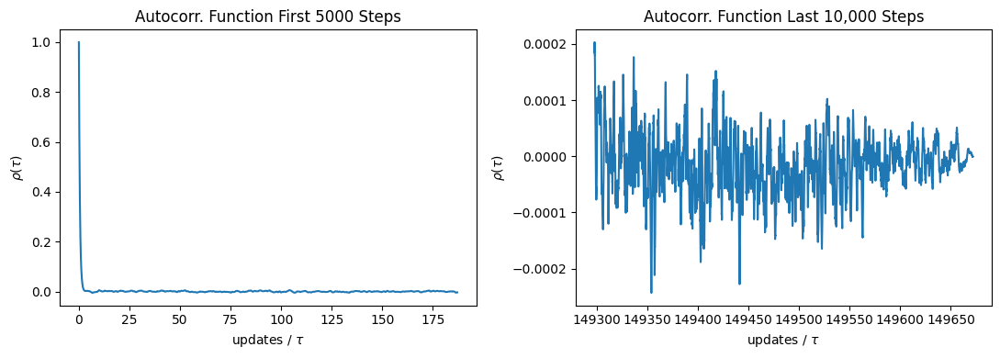

Estimated IAT:  [26.72514326]
[[0.01039956 0.         0.        ]
 [0.         0.01039956 0.        ]
 [0.         0.         1.        ]]


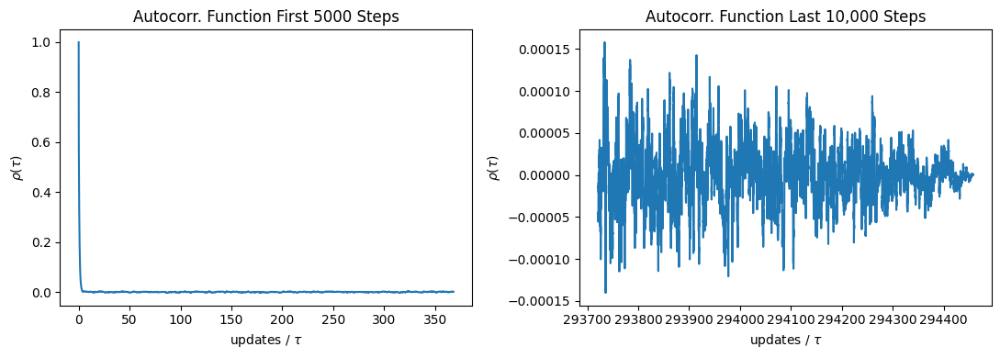

Estimated IAT:  [13.58429355]


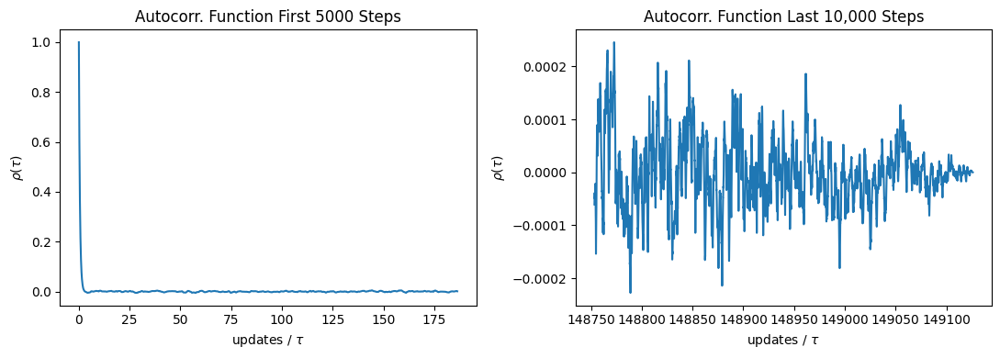

Estimated IAT:  [26.82293541]
[[0.00990099 0.         0.        ]
 [0.         0.00990099 0.        ]
 [0.         0.         1.        ]]


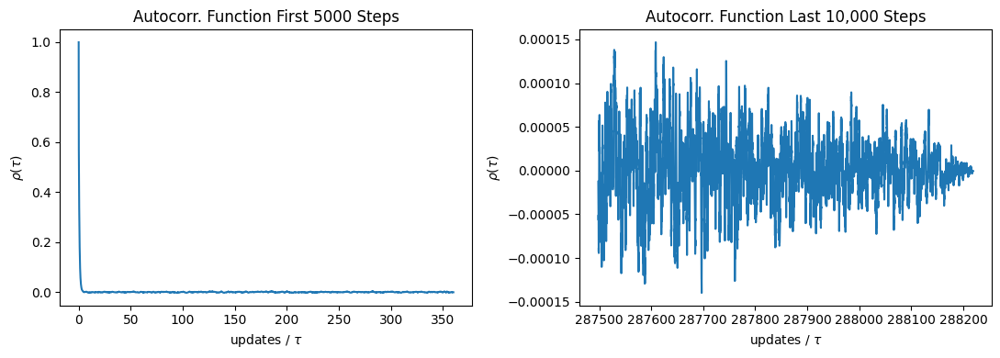

Estimated IAT:  [13.87834724]


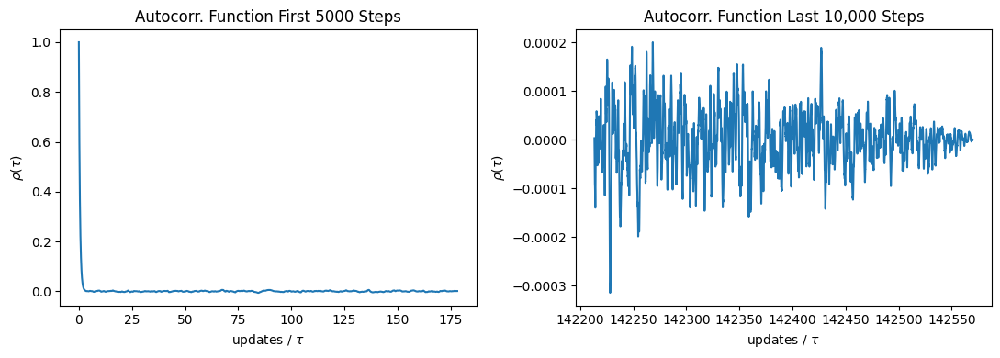

Estimated IAT:  [28.05641834]


In [34]:
alpha_li = np.linspace(9, 101, 20)
iat_r_li = []
iat_a_li = []
for alpha in alpha_li:
  var_li = np.array([alpha, alpha, 1])
  samples_hit, C_inv, C_inv_root = multivar_normal_hit_2(5000000, var_li, np.zeros(3))
  f_tau_r, iat_r = iat(samples_hit, C_inv, "r", C_inv_root)
  iat_r_li.append(iat_r)
  f_tau_a, iat_a = iat(samples_hit, C_inv, "a", C_inv_root)
  iat_a_li.append(iat_a)

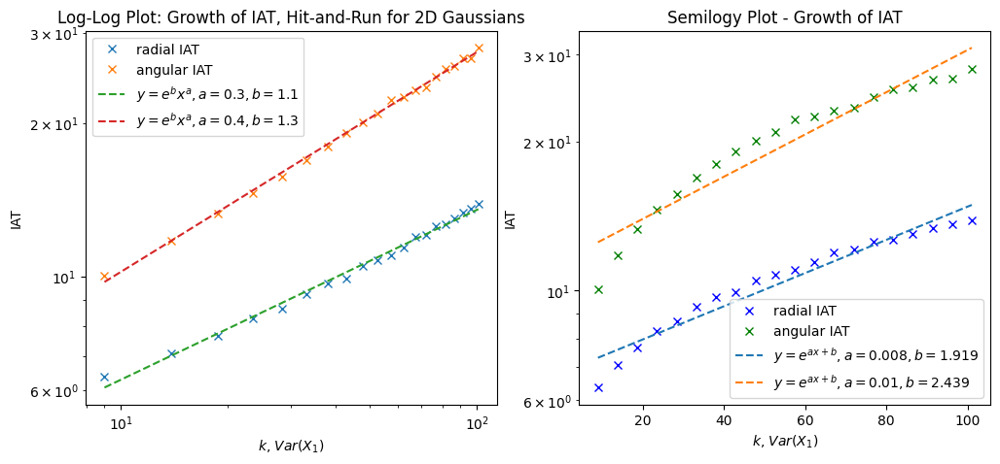

In [35]:
log_alpha = np.log(np.array(alpha_li))
log_iat_r = np.log(np.array(iat_r_li)).flatten()
log_iat_a = np.log(np.array(iat_a_li)).flatten()
fit_line = np.polyfit(log_alpha, log_iat_r, 1)
p = np.poly1d(fit_line)
fit_line_a = np.polyfit(log_alpha, log_iat_a, 1)
p_a = np.poly1d(fit_line_a)

fit_line_er = np.polyfit(np.array(alpha_li), log_iat_r, 1)
p_er = np.poly1d(fit_line_er)
fit_line_ea = np.polyfit(np.array(alpha_li), log_iat_a, 1)
p_ea = np.poly1d(fit_line_ea)

fig = plt.figure(figsize=(12,5))
ax = fig.add_subplot(1,2,1)
ax.loglog(alpha_li, iat_r_li, 'x', label="radial IAT")
ax.loglog(alpha_li, iat_a_li, 'x', label="angular IAT")
ax.loglog(alpha_li, np.exp(p(log_alpha)), '--', label=r"$y = e^{{b}}x^{{a}}, a = {a}, b = {b}$".format(a = round(fit_line[0], 1), b = round(fit_line[1], 1)))
ax.loglog(alpha_li, np.exp(p_a(log_alpha)), '--', label=r"$y = e^{{b}}x^{{a}}, a = {a}, b = {b}$".format(a = round(fit_line_a[0], 1), b = round(fit_line_a[1], 1)))
ax.legend()
ax.set_xlabel(r"$k$, $Var(X_1)$")
ax.set_ylabel(r"IAT")
ax.set_title(r"Log-Log Plot: Growth of IAT, Hit-and-Run for 2D Gaussians")
ax_2 = fig.add_subplot(1,2,2)
ax_2.semilogy(alpha_li, iat_r_li, 'bx', label="radial IAT")
ax_2.semilogy(alpha_li, iat_a_li, 'gx', label="angular IAT")
ax_2.semilogy(alpha_li, np.exp(p_er(np.array(alpha_li))), '--', label=r"$y = e^{{ax+b}}, a = {a}, b = {b}$".format(a = round(fit_line_er[0], 3), b = round(fit_line_er[1], 3)))
ax_2.semilogy(alpha_li, np.exp(p_ea(np.array(alpha_li))), '--', label=r"$y = e^{{ax+b}}, a = {a}, b = {b}$".format(a = round(fit_line_ea[0], 3), b = round(fit_line_ea[1], 3)))
ax_2.legend()
ax_2.set_xlabel(r"$k$, $Var(X_1)$")
ax_2.set_ylabel(r"IAT")
ax_2.set_title(r"Semilogy Plot - Growth of IAT")
plt.show()

## Coordinate-Free Randomized Kaczmarz

In [36]:
@jit(nopython=True)
def kaczmarz_demo(a, N:int, chains:int):
  # we solve Ax=0
  A = np.array([[0.0, 1.0], [a, 1.0]])
  x_0 = np.array([-10.0, 0.0])

  # # the output will be the 2-norms of the iterates
  # # we will run multiple chains and take average of norms
  normsq = np.zeros((N+1, chains))

  for j in range(chains):
    # for each chain:
    X = np.zeros((N+1, 2))
    X[0] = x_0
    for k in range(N):
      v = np.array([np.random.randn(), np.random.randn()])
      v = v / np.sqrt(np.dot(v, v))
      A_Tv = np.dot(np.transpose(A), v)
      X[k+1] = X[k] - ( np.dot(A_Tv, X[k]) / (np.sum(A_Tv**2)) ) * A_Tv
      # each column of norms correspond to a chain
      normsq[k+1, j] = np.sum(X[k+1]**2)

  # compute average for each row
  avg_normsq = np.zeros(N+1)
  for k in range(N+1):
     avg_normsq[k] = np.sum(normsq[k]) / chains
  mse = np.sqrt(avg_normsq)

  return mse

In [37]:
iter = kaczmarz_demo(a = 0.1, N = 300, chains = 10000)

In [38]:
iter_2 = kaczmarz_demo(a = 0.01, N = 3000, chains = 10000)

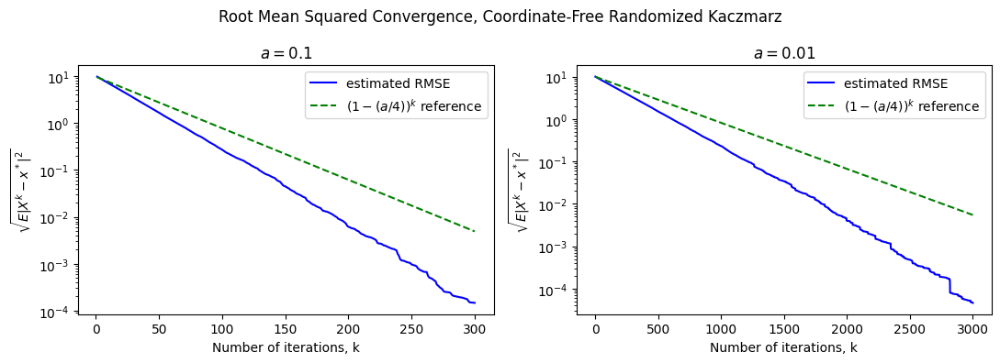

In [39]:
# plotting mse
fig = plt.figure(figsize=(11,4))
ax = fig.add_subplot(1,2,1)
ax.semilogy(range(iter.shape[0])[1:], iter[1:], 'b', label="estimated RMSE")
ax.semilogy(range(iter.shape[0])[1:], [iter[1]*(1 - 0.025)**k for k in range(iter.shape[0])][1:], 'g--', label="$(1-(a/4))^k$ reference")
ax.set_xlabel("Number of iterations, k")
ax.set_ylabel("$\sqrt{E|X^k - x^*|^2}$")
ax.set_title("$a = 0.1$")
ax.legend()
ax_2 = fig.add_subplot(1,2,2)
ax_2.semilogy(range(iter_2.shape[0])[1:], iter_2[1:], 'b', label="estimated RMSE")
ax_2.semilogy(range(iter_2.shape[0])[1:], [iter_2[1]*(1 - 0.0025)**k for k in range(iter_2.shape[0])][1:], 'g--', label="$(1-(a/4))^k$ reference")
ax_2.set_xlabel("Number of iterations, k")
ax_2.set_ylabel("$\sqrt{E|X^k - x^*|^2}$")
ax_2.set_title("$a = 0.01$")
ax_2.legend()
fig.suptitle("Root Mean Squared Convergence, Coordinate-Free Randomized Kaczmarz")
fig.tight_layout()
plt.show()